<a href="https://colab.research.google.com/github/100jy/ShowMeTheMoney/blob/main/20190620_20210620ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
from tqdm import tqdm

## 문제1) 시각화 및 자료 분석
- Visualize provided KOSPI 200 dataset and analyze its characteristics

### 데이터 확인

In [ ]:

# 시가
open = pd.read_csv("/[open]kospi200_equities_20190620_20210620.csv")
# 종가
close = pd.read_csv("/[close]kospi200_equities_20190620_20210620.csv")
# 거래량
volume = pd.read_csv("/[volume]kospi200_equities_20190620_20210620.csv")
# 고가
high = pd.read_csv("/[high]kospi200_equities_20190620_20210620.csv")
# 저가
low = pd.read_csv("/[low]kospi200_equities_20190620_20210620.csv")
# 전일비
## 중복값 및 비정상 열 제거
rate = pd.read_csv("/[rate]kospi200_equities_20190620_20210620.csv").drop_duplicates(keep='first').iloc[:-1,:]

# 시가
datas = {
    "시가" : open,
    "종가" : close,
    "거래량" : volume,
    "고가" : high,
    "저가" : low,
    "전일비" : rate}

In [ ]:
# 일단위 종목별 시작 가격을 기록
open.head(5)

,name,2019-06-20 00:00:00,2019-06-21 00:00:00,2019-06-22 00:00:00,2019-06-23 00:00:00,2019-06-24 00:00:00,2019-06-25 00:00:00,2019-06-26 00:00:00,2019-06-27 00:00:00,2019-06-28 00:00:00,...,2021-06-10 00:00:00,2021-06-11 00:00:00,2021-06-12 00:00:00,2021-06-13 00:00:00,2021-06-14 00:00:00,2021-06-15 00:00:00,2021-06-16 00:00:00,2021-06-17 00:00:00,2021-06-18 00:00:00,2021-06-19 00:00:00
0,한섬,39350.0,39500.0,NaN,NaN,39150.0,39500.0,38400.0,37350.0,36700.0,...,44550.0,43800.0,NaN,NaN,43600.0,42900.0,43000.0,42750.0,42200.0,NaN
1,CJ,104000.0,103500.0,NaN,NaN,103500.0,102500.0,103000.0,102000.0,101500.0,...,109500.0,111500.0,NaN,NaN,110500.0,109500.0,107500.0,108000.0,109500.0,NaN
2,삼성물산,94000.0,96100.0,NaN,NaN,96200.0,96400.0,96100.0,95800.0,95800.0,...,139500.0,140500.0,NaN,NaN,140500.0,138500.0,137500.0,137000.0,137000.0,NaN
3,강원랜드,31400.0,30950.0,NaN,NaN,31350.0,31000.0,30400.0,30450.0,30450.0,...,28850.0,28500.0,NaN,NaN,28400.0,28200.0,28100.0,28200.0,28150.0,NaN
4,KB금융,45600.0,45000.0,NaN,NaN,44900.0,45000.0,44950.0,45050.0,46000.0,...,56900.0,57000.0,NaN,NaN,57000.0,55600.0,56000.0,57100.0,56500.0,NaN


In [ ]:
# 일단위 종목별 종료 가격을 기록
close.head(5)

,name,2019-06-20 00:00:00,2019-06-21 00:00:00,2019-06-22 00:00:00,2019-06-23 00:00:00,2019-06-24 00:00:00,2019-06-25 00:00:00,2019-06-26 00:00:00,2019-06-27 00:00:00,2019-06-28 00:00:00,...,2021-06-10 00:00:00,2021-06-11 00:00:00,2021-06-12 00:00:00,2021-06-13 00:00:00,2021-06-14 00:00:00,2021-06-15 00:00:00,2021-06-16 00:00:00,2021-06-17 00:00:00,2021-06-18 00:00:00,2021-06-19 00:00:00
0,한섬,39650.0,39450.0,NaN,NaN,39350.0,38650.0,37300.0,36700.0,37000.0,...,43800.0,43500.0,NaN,NaN,42850.0,43150.0,43050.0,42400.0,42700.0,NaN
1,CJ,103500.0,103000.0,NaN,NaN,102500.0,103000.0,102000.0,101000.0,101000.0,...,111000.0,110000.0,NaN,NaN,109000.0,108500.0,109000.0,109000.0,107500.0,NaN
2,삼성물산,96400.0,95400.0,NaN,NaN,95900.0,96100.0,95900.0,96400.0,95700.0,...,140500.0,140500.0,NaN,NaN,139000.0,138000.0,138000.0,136500.0,136000.0,NaN
3,강원랜드,31200.0,31300.0,NaN,NaN,30900.0,30600.0,30600.0,30700.0,30250.0,...,28350.0,28200.0,NaN,NaN,28150.0,28000.0,28200.0,28150.0,27700.0,NaN
4,KB금융,45500.0,45350.0,NaN,NaN,45050.0,44950.0,45400.0,45750.0,45850.0,...,57200.0,57000.0,NaN,NaN,56200.0,55900.0,56900.0,56900.0,56800.0,NaN


In [ ]:
# 일단위 종목별 거래량을 기록
volume.head(5)

,name,2019-06-20 00:00:00,2019-06-21 00:00:00,2019-06-22 00:00:00,2019-06-23 00:00:00,2019-06-24 00:00:00,2019-06-25 00:00:00,2019-06-26 00:00:00,2019-06-27 00:00:00,2019-06-28 00:00:00,...,2021-06-10 00:00:00,2021-06-11 00:00:00,2021-06-12 00:00:00,2021-06-13 00:00:00,2021-06-14 00:00:00,2021-06-15 00:00:00,2021-06-16 00:00:00,2021-06-17 00:00:00,2021-06-18 00:00:00,2021-06-19 00:00:00
0,한섬,44806.0,48244.0,NaN,NaN,62018.0,57723.0,80898.0,78536.0,66969.0,...,89777,61943,NaN,NaN,94439,92425,79256,144910,102673,NaN
1,CJ,85231.0,71853.0,NaN,NaN,35945.0,62929.0,36776.0,63388.0,42122.0,...,139427,93114,NaN,NaN,79070,100221,55250,84132,205804,NaN
2,삼성물산,406574.0,272771.0,NaN,NaN,175071.0,221170.0,154167.0,224316.0,164589.0,...,574635,257479,NaN,NaN,378676,245022,326970,324623,385644,NaN
3,강원랜드,161726.0,209767.0,NaN,NaN,163633.0,289581.0,216845.0,271366.0,231966.0,...,1256441,809802,NaN,NaN,607522,748250,920455,696360,957641,NaN
4,KB금융,967327.0,995127.0,NaN,NaN,695092.0,501520.0,625369.0,877190.0,817890.0,...,1336878,810885,NaN,NaN,1080418,950322,1172338,1208470,1240029,NaN


In [ ]:
# 일단위 종목별 최고가를 기록
high.head(5)

,name,2019-06-20 00:00:00,2019-06-21 00:00:00,2019-06-22 00:00:00,2019-06-23 00:00:00,2019-06-24 00:00:00,2019-06-25 00:00:00,2019-06-26 00:00:00,2019-06-27 00:00:00,2019-06-28 00:00:00,...,2021-06-10 00:00:00,2021-06-11 00:00:00,2021-06-12 00:00:00,2021-06-13 00:00:00,2021-06-14 00:00:00,2021-06-15 00:00:00,2021-06-16 00:00:00,2021-06-17 00:00:00,2021-06-18 00:00:00,2021-06-19 00:00:00
0,한섬,40100.0,39800.0,NaN,NaN,39750.0,39500.0,38500.0,37400.0,37800.0,...,44550.0,44300.0,NaN,NaN,43750.0,43300.0,43150.0,42800.0,42950.0,NaN
1,CJ,104000.0,104000.0,NaN,NaN,103500.0,104500.0,103500.0,102000.0,102500.0,...,111000.0,112000.0,NaN,NaN,111000.0,109500.0,109500.0,109000.0,112500.0,NaN
2,삼성물산,97000.0,96500.0,NaN,NaN,96200.0,97100.0,96300.0,97000.0,96300.0,...,142500.0,142500.0,NaN,NaN,140500.0,139000.0,138500.0,137500.0,137500.0,NaN
3,강원랜드,31400.0,31300.0,NaN,NaN,31400.0,31150.0,30750.0,30800.0,30700.0,...,29200.0,28650.0,NaN,NaN,28700.0,28300.0,28400.0,28350.0,28200.0,NaN
4,KB금융,46000.0,45750.0,NaN,NaN,45350.0,45400.0,45400.0,45900.0,46100.0,...,57300.0,57500.0,NaN,NaN,57000.0,56400.0,57300.0,57700.0,57100.0,NaN


In [ ]:
# 일단위 종목별 최저가를 기록
low.head(5)

,name,2019-06-20 00:00:00,2019-06-21 00:00:00,2019-06-22 00:00:00,2019-06-23 00:00:00,2019-06-24 00:00:00,2019-06-25 00:00:00,2019-06-26 00:00:00,2019-06-27 00:00:00,2019-06-28 00:00:00,...,2021-06-10 00:00:00,2021-06-11 00:00:00,2021-06-12 00:00:00,2021-06-13 00:00:00,2021-06-14 00:00:00,2021-06-15 00:00:00,2021-06-16 00:00:00,2021-06-17 00:00:00,2021-06-18 00:00:00,2021-06-19 00:00:00
0,한섬,39100.0,39000.0,NaN,NaN,38500.0,38300.0,36900.0,36500.0,36600.0,...,43800.0,43500.0,NaN,NaN,42650.0,42750.0,42700.0,42100.0,41950.0,NaN
1,CJ,102000.0,102500.0,NaN,NaN,102000.0,102000.0,101500.0,100500.0,101000.0,...,108000.0,109000.0,NaN,NaN,108000.0,107000.0,107500.0,107000.0,107500.0,NaN
2,삼성물산,93900.0,95200.0,NaN,NaN,95400.0,95300.0,95400.0,94800.0,95500.0,...,138500.0,139500.0,NaN,NaN,138000.0,137500.0,137000.0,136000.0,135500.0,NaN
3,강원랜드,31050.0,30950.0,NaN,NaN,30600.0,30600.0,30350.0,30100.0,30200.0,...,28300.0,28100.0,NaN,NaN,28100.0,27900.0,28000.0,27850.0,27700.0,NaN
4,KB금융,45350.0,45000.0,NaN,NaN,44550.0,44650.0,44500.0,44900.0,45750.0,...,56400.0,56600.0,NaN,NaN,55700.0,55400.0,55900.0,56300.0,56100.0,NaN


In [ ]:
# 일단위 종목별 전일비를 기록
rate.head(5)

,name,2019-06-20 00:00:00,2019-06-21 00:00:00,2019-06-22 00:00:00,2019-06-23 00:00:00,2019-06-24 00:00:00,2019-06-25 00:00:00,2019-06-26 00:00:00,2019-06-27 00:00:00,2019-06-28 00:00:00,...,2021-06-10 00:00:00,2021-06-11 00:00:00,2021-06-12 00:00:00,2021-06-13 00:00:00,2021-06-14 00:00:00,2021-06-15 00:00:00,2021-06-16 00:00:00,2021-06-17 00:00:00,2021-06-18 00:00:00,2021-06-19 00:00:00
0,한섬,0.014066,-0.005044,NaN,NaN,-0.002535,-0.017789,-0.034929,-0.016086,0.008174,...,-0.014623,-0.006849,NaN,NaN,-0.014943,0.007001,-0.002317,-0.015099,0.007075,NaN
1,CJ,0.000000,-0.004831,NaN,NaN,-0.004854,0.004878,-0.009709,-0.009804,0.000000,...,0.018349,-0.009009,NaN,NaN,-0.009091,-0.004587,0.004608,0.000000,-0.013761,NaN
2,삼성물산,0.025532,-0.010373,NaN,NaN,0.005241,0.002086,-0.002081,0.005214,-0.007261,...,0.003571,0.000000,NaN,NaN,-0.010676,-0.007194,0.000000,-0.010870,-0.003663,NaN
3,강원랜드,0.001605,0.003205,NaN,NaN,-0.012780,-0.009709,0.000000,0.003268,-0.014658,...,-0.003515,-0.005291,NaN,NaN,-0.001773,-0.005329,0.007143,-0.001773,-0.015986,NaN
4,KB금융,-0.005464,-0.003297,NaN,NaN,-0.006615,-0.002220,0.010011,0.007709,0.002186,...,0.005272,-0.003497,NaN,NaN,-0.014035,-0.005338,0.017889,0.000000,-0.001757,NaN


### 결측값 분석
- 해당 데이터의 특성상 주말, 공휴일은 데이터가 존재하지 않아 none값으로 기록된 것을 확인 했습니다.
- 제공 해주신 시가, 종가, 거래량, 고가, 저가, 전일비 6개 테이블 모두 결측 위치가 같을 것을 파악했습니다.

In [ ]:
# 주말 공휴일은 결측
week = ["월", "화", "수", "목", "금", "토", "일"]
# 토
print("2019.6.22 : ", week[datetime.date(2019,6,22).weekday()])
# 일
print("2019.6.23 : ", week[datetime.date(2019,6,23).weekday()])
# 공휴일
print('크리스마스 : ', week[datetime.date(2019,12,25).weekday()])
# 공휴일 결측 여부
print("크리스마스 결측 여부 : ", sum(open['2019-12-25 00:00:00'].isna()) == len(open))

2019.6.22 :  토
2019.6.23 :  일
크리스마스 :  수
크리스마스 결측 여부 :  True


In [ ]:
# 전체 테이블에서 결측치 위치가 동일함을 확인
total_bins = open.values.flatten().shape[0]
print("전체 bin 개수 : ", total_bins)

print("시가 결측 == 종가 결측 : ", (open.isna() == close.isna()).values.sum() == total_bins)
print("종가 결측 == 거래량 결측 : ", (close.isna() == volume.isna()).values.sum() == total_bins)
print("거래량 결측 == 고가 결측 : ", (volume.isna()  == high.isna()).values.sum() == total_bins)
print("고가 결측 == 저가 결측 : ", (high.isna() == low.isna()).values.sum() == total_bins)
print("저가 결측 == 전일비 결측 : ", (low.isna() == rate.isna()).values.sum() == total_bins)

전체 bin 개수 :  146400
시가 결측 == 종가 결측 :  True
종가 결측 == 거래량 결측 :  True
거래량 결측 == 고가 결측 :  True
고가 결측 == 저가 결측 :  True
저가 결측 == 전일비 결측 :  True


### 주말, 공휴일 제거
- 편의를 위해 주말, 공휴일이여서 none값으로 기록된 column들을 제거해주었습니다.
- 일부 종목은 상장 시점 이전의 column들이  none값으로 기록된 것을 확인했습니다.

In [ ]:
# 주말, 공휴일은 주식 거래가 없기 때문에 결측으로 기록됨
# 해당 일자들을 제외하고 분석
# 공휴일 주말 일자 컬럼 제거
nomal_missing = open.columns[~open.iloc[0].isna().values]

data_without_holiday = {
    name : table[nomal_missing]
    for name, table in datas.items()
}

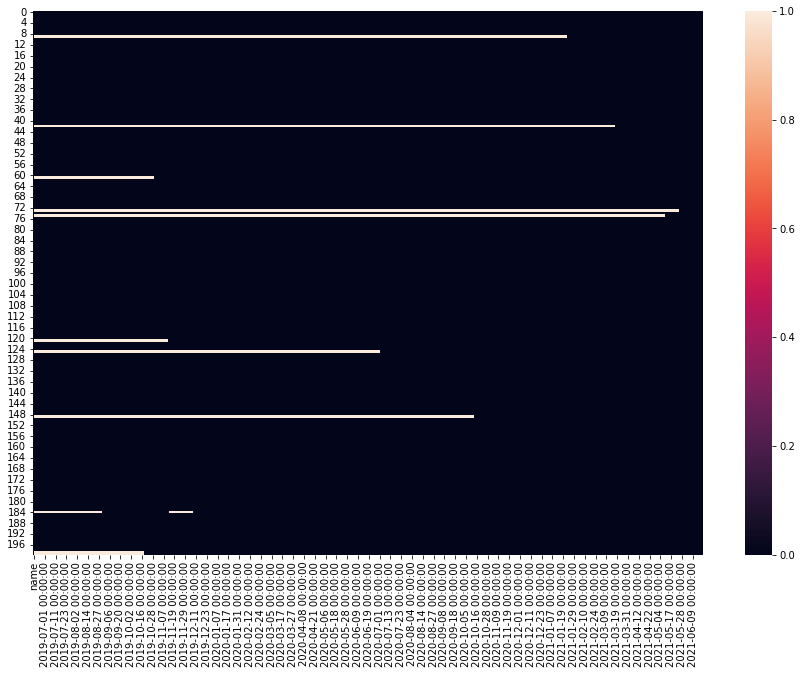

In [ ]:
# 일부 종목은 상장 시점이 테이블의 시작 시점 이후여서 결측이 존재
# 해당 종목은 관측 시작 일자부터 분석
plt.figure(figsize=(15,10))
sns.heatmap(data_without_holiday['시가'].isna())
plt.show()

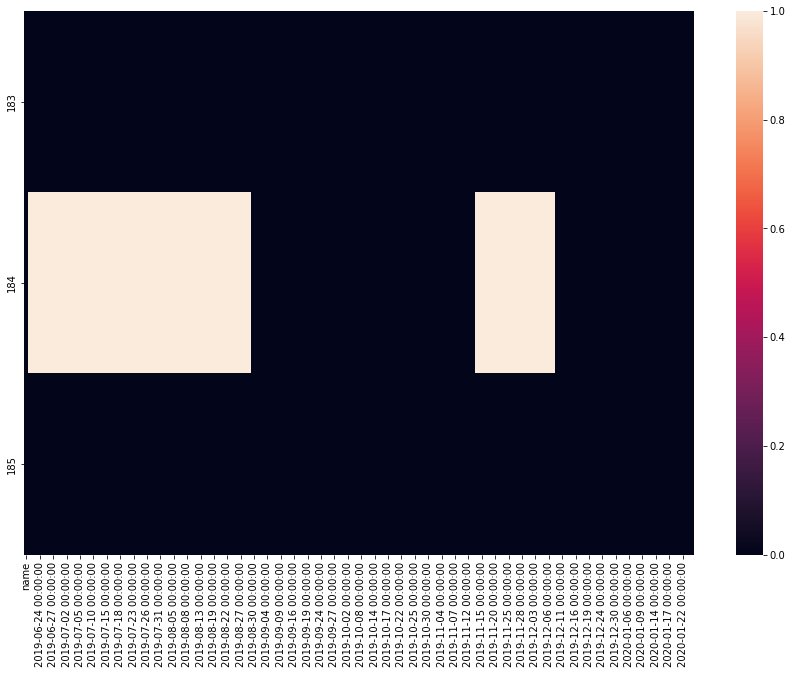

In [ ]:
# 삼성 엔지니어링 종목(184번)에서 2019-08-30 이전과 2019-11-18 ~ 2019-12-09 기간 동안 결측이 발생
# 포털 주식정보 플랫폼에서 확인 결과 해당 일자 정보가 존재함을 확인
# 다른 api 통해 결측일자 정보 존재 시 결측값 대치
plt.figure(figsize=(15,10))
sns.heatmap(data_without_holiday['시가'].iloc[183:186, :150].isna())
plt.show()

### 비정상 결측값 대치
- 삼성엔지니어링 종목에 대해서 비정상 결측이 있는 것을 확인하고 네이버 금융 api를 통해 결측값을 채워주었습니다.

In [ ]:
unexpected_missing = [x not in data_without_holiday['시가'].dropna()['name'].values for x in data_without_holiday['시가']['name']]

In [ ]:
 data_without_holiday['시가']['name'][unexpected_missing]

9           DL이앤씨
42      SK바이오사이언스
61            지누스
73          LX홀딩스
75     SK아이이테크놀로지
121         한화시스템
125        SK바이오팜
149           하이브
184       삼성엔지니어링
199         두산퓨얼셀
Name: name, dtype: object

- 아래 종목들에서 결측이 발생 하였으나 삼성 엔지니어링을 제외한 다른 종목들은 상장 이전의 정보가 없는 정상적인 결측으로 확인
- 비정상 결측이 있는 삼성엔지니어링은 결측치를 대치하여 분석

  - DL이앤씨
    - 2021.01.25 재상장
    - 정상 결측

  - SK바이오사이언스
    - 2020년 7월 2일 신규상장
    - 정상 결측

  -  지누스
    - 2019.10.30 재상장
    - 정상 결측

  - LX홀딩스
    - 21.03 lg에서 분할상장
    - 정상 결측

  -  SK아이이테크놀로지
    - 2021.5.11 신규상장
    - 정상 결측

  -  한화시스템
    - 2019.11.13 신규상장
    - 정상 결측

  - SK바이오팜
    - 2020.07.02 신규상장
    - 정상 결측

  - 하이브
    - 2020.10 신규상장
    - 정상 결측

  - 삼성엔지니어링
    - 결측기간 중 거래정보 확인
    - **비정상 결측**

  - 두산퓨얼셀
    - 2019.10 신규상장
    - 정상 결측

In [ ]:
from urllib import parse
from ast import literal_eval
import requests

def get_sise(code, start_time, end_time, time_from='day') :
  get_param = { 'symbol':code, 'requestType':1, 'startTime':start_time, 'endTime':end_time, 'timeframe':time_from }
  get_param = parse.urlencode(get_param)
  url="https://api.finance.naver.com/siseJson.naver?%s"%(get_param)
  response = requests.get(url)
  return literal_eval(response.text.strip())

raw_val = get_sise('028050', '20190619', '20210619', 'day')

In [ ]:
# url통해 네이버 파이넨셜 api request
samsung_eng_naver = pd.DataFrame(np.array(raw_val)[1:, ], columns=raw_val[0])

# 전일비는 제공되지 않아 직접 계산하여 사용
# 전일비 := (당일 종가 - 전일 종가)/ (전일 종가)
samsung_eng_rate = samsung_eng_naver.rolling(2).apply(lambda x: (x.iloc[1]-x.iloc[0])/(x.iloc[0])).iloc[1:, 3].values

In [ ]:
# 검증
# 구해진 전일비와 실제 기록치 같은 것을 확인
samsung_logistic_raw_val = get_sise('028260', '20190619', '20210619', 'day')
samsung_logisti_naver = pd.DataFrame(np.array(samsung_logistic_raw_val)[1:, ], columns=samsung_logistic_raw_val[0])
samsung_logisti_naver.iloc[:, 1:].rolling(2).apply(lambda x: (x.iloc[1]-x.iloc[0])/(x.iloc[0]))['종가']

0           NaN
1      0.025532
2     -0.010373
3      0.005241
4      0.002086
         ...   
491   -0.010676
492   -0.007194
493    0.000000
494   -0.010870
495   -0.003663
Name: 종가, Length: 496, dtype: float64

In [ ]:
 data_without_holiday['전일비'][ data_without_holiday['전일비']['name'] == '삼성물산']

,name,2019-06-20 00:00:00,2019-06-21 00:00:00,2019-06-24 00:00:00,2019-06-25 00:00:00,2019-06-26 00:00:00,2019-06-27 00:00:00,2019-06-28 00:00:00,2019-07-01 00:00:00,2019-07-02 00:00:00,...,2021-06-07 00:00:00,2021-06-08 00:00:00,2021-06-09 00:00:00,2021-06-10 00:00:00,2021-06-11 00:00:00,2021-06-14 00:00:00,2021-06-15 00:00:00,2021-06-16 00:00:00,2021-06-17 00:00:00,2021-06-18 00:00:00
2,삼성물산,0.025532,-0.010373,0.005241,0.002086,-0.002081,0.005214,-0.007261,0.003135,-0.008333,...,0.010714,0.010601,-0.020979,0.003571,0.0,-0.010676,-0.007194,0.0,-0.01087,-0.003663


In [ ]:
samsung_eng_naver_truc = samsung_eng_naver.iloc[1:, :]
samsung_eng_naver_truc['전일비'] = samsung_eng_rate

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
samsung_eng_naver_truc.head()

,날짜,시가,고가,저가,종가,거래량,외국인소진율,전일비
1,20190620,17100,17200,17000,17150,623486,29.43,0.005917
2,20190621,17150,17400,16950,17150,755435,29.56,-0.002941
3,20190624,17200,17250,16950,17000,333926,29.62,0.000000
4,20190625,17050,17300,17050,17200,579091,29.74,0.005900
5,20190626,17150,17300,17050,17250,425528,29.81,0.000000


In [ ]:
 data_without_holiday['전일비'][ data_without_holiday['전일비']['name'] == '삼성엔지니어링'] = ["삼성엔지니어링"] + samsung_eng_naver_truc['전일비'].values.tolist()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1797: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, v, pi)


### 추세 분석
- 전체 종목들의 종가의 평균을 이용해 전체적인 추세를 보았습니다.
- 관측 기간중 20.03.19 부근에서 전체적인 큰 하락을 보이는 이벤트가 있었습니다.
  - 해당 이벤트의 원인으로 [관련 기사](https://www.mk.co.kr/news/world/view/2020/03/287959/)를 찾을 수 있었습니다.
  - 또한 해당 시점 이후로 전반적으로 꾸준한 상승세를 보이는 것을 확인할 수 있었습니다.
- 가장 큰 상승을 보인 종목은 LG생활건강이었으며, 가장 큰 하락을 보인 종목은 메리츠증권이었습니다.

In [ ]:
def plot_trend(row, title):
  # 평균 변화율의 시간에 따른 증감
  fig, ax1 = plt.subplots(figsize=(20,10))
  diff_ratio = (row.diff()/row)
  diff_ratio.plot()
  ax1.axhline(diff_ratio.std(), color='r')
  ax1.axhline(-diff_ratio.std(), color='r')
  plt.legend(["mean ratio", "1*sigma"])
  plt.show()

  fig, ax1 = plt.subplots(figsize=(20,10))
  row.plot(ax=ax1)
  plt.title(title, size=20)

  plt.text(np.where(row==row.min())[0][0], row.min(), row.index[row==row.min()][0])
  plt.text(np.where(row==row.max())[0][0], row.max(), row.index[row==row.max()][0])

  ## 전일 대비 평균 변화율이 1 * sigma 보다 크게 증가한 지점들
  max_rate_day = diff_ratio[diff_ratio > diff_ratio.std()].index
  plt.scatter(np.where(row.index.isin(max_rate_day)), row[row.index.isin(max_rate_day)], marker='o', c='red')

  ## 전일 대비 평균 변화율이 -1 * sigma 보다 크게 하락한 지점들
  min_rate_day = diff_ratio[diff_ratio < -diff_ratio.std()].index
  plt.scatter(np.where(row.index.isin(min_rate_day)), row[row.index.isin(min_rate_day)], marker='^', c='blue')

  plt.legend(["average end price", "huge increase", "huge decrease"])

  plt.show()

  return


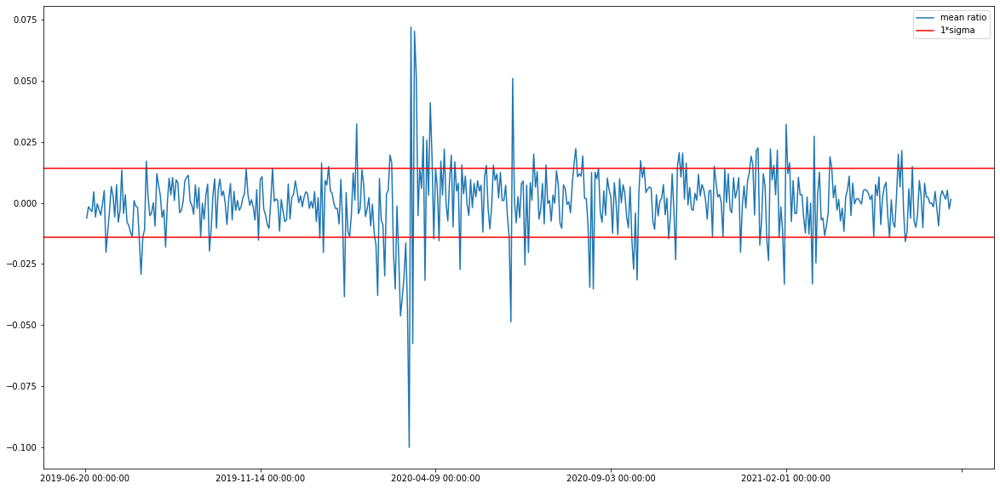

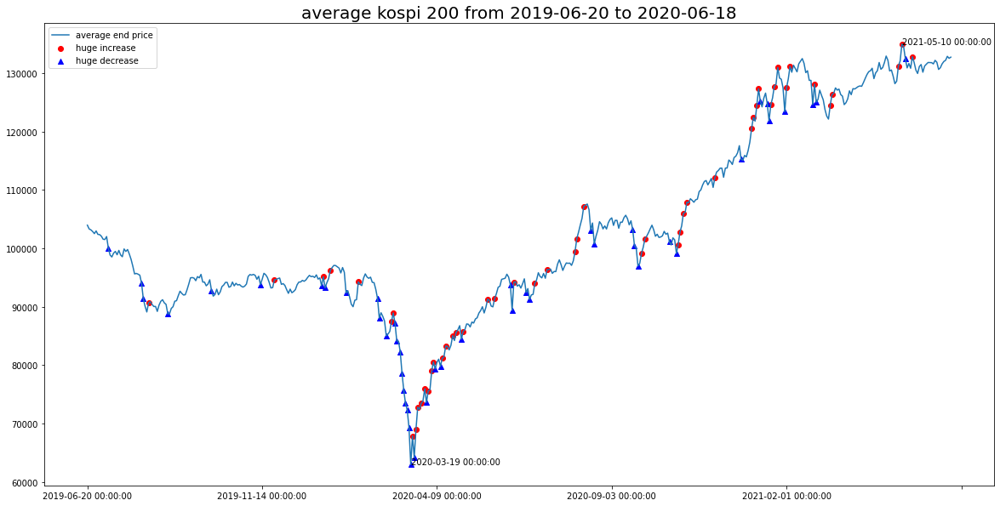

In [ ]:
# 코스피 200 종목들에 대해 주당 가격 평균(종가 기준)을 분석

# 2020-04 시점에 큰 하락
# 이후 평균선으로 복귀
# 이후 2021-01까지 꾸준한 상승을 보임
# 2021-01이후 부터 다시 평균선에서 소규모 증감을 보임


# 21-03-19 최하점
## 안전 자신인 달러 확보를 위해 외인들 매도가 증가하면 주가가 크게 하락함 (1)
## 이후 한미간 통화스와프 체결으로 주가가 이전 수준 회복 (2)
## (1) https://www.mk.co.kr/news/world/view/2020/03/287959/, (2) https://www.mbn.co.kr/news/economy/4094538

mean_kospi = data_without_holiday['종가'].mean(axis=0)
plot_trend(mean_kospi, "average kospi 200 from 2019-06-20 to 2020-06-18")

In [ ]:
diff_end = data_without_holiday['종가'].iloc[:,1:].diff(axis=1)
max_change = diff_end.max(axis=1)

LG생활건강


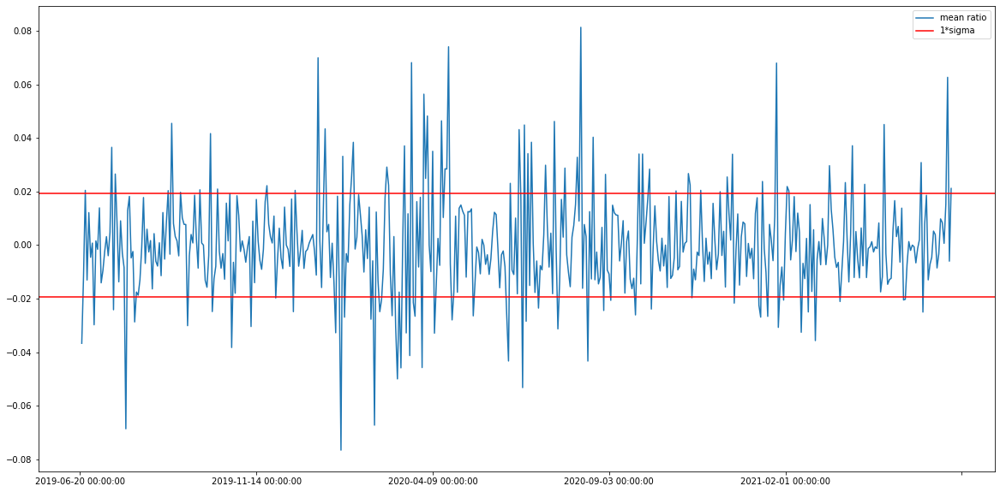

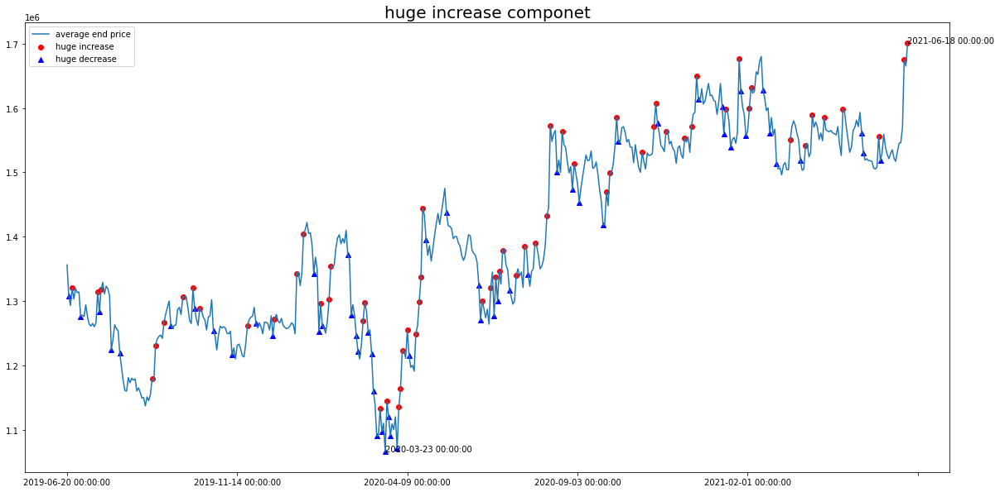

In [ ]:
# 가장 큰 상승이 있었던 종목
## LG생활건강
print(max_change_componet[0])
max_change_componet = data_without_holiday['종가'].iloc[max_change.argmax(),:]
plot_trend(max_change_componet[1:], "huge increase componet")

메리츠증권


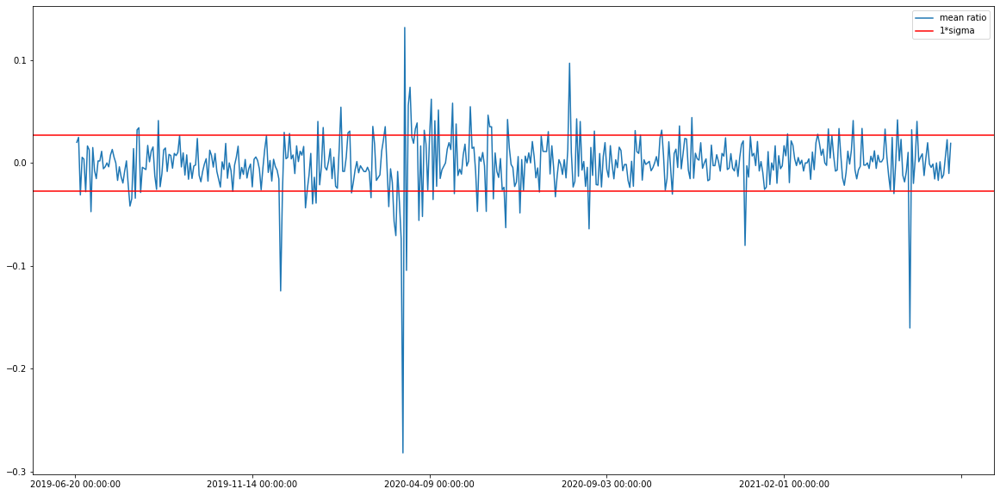

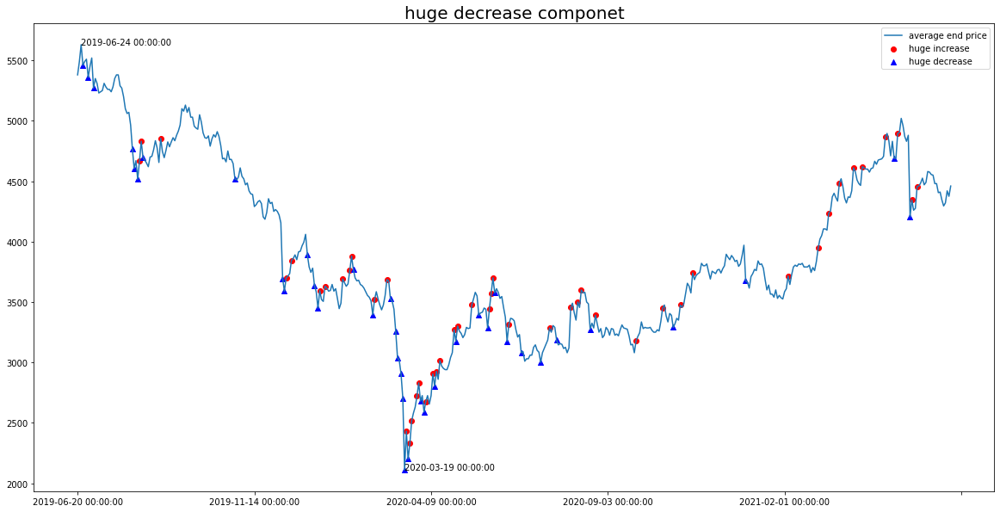

In [ ]:
# 가장 큰 하락이 있었던 종목
## 메리츠증권
print(min_change_componet[0])
min_change_componet = data_without_holiday['종가'].iloc[max_change.argmin(),:]
plot_trend(min_change_componet[1:], "huge decrease componet")

## 문제2) 예측치 문제점 분석
- We provide you the forecasting of stock prices for 2021-06-13 ~ 2021-06-19
of each KOSPI 200 component
- Analyze its characteristics and identify flaws/problems of this forecasting
results

In [ ]:
# 종가 예측
# Temporal Fusion Transformer 이용
## https://arxiv.org/abs/1912.09363
# 주말, 공휴일은 보간법으로 대치됨
pred = pd.read_csv("/predictions.csv", encoding='euc-kr')
# 주말은 분석 대상에서 제외
pred = pred.drop(['2021-06-13 00:00:00', "2021-06-19 00:00:00"], axis=1)
pred.head()

,name,2021-06-14 00:00:00,2021-06-15 00:00:00,2021-06-16 00:00:00,2021-06-17 00:00:00,2021-06-18 00:00:00
0,한섬,43439.980469,43712.464844,43657.488281,43720.164062,43724.910156
1,CJ,108971.093750,109041.296875,108698.890625,109084.710938,108750.632812
2,삼성물산,138995.437500,139851.421875,139539.875000,139442.593750,139694.109375
3,강원랜드,27279.365234,27683.734375,27772.910156,27563.041016,27708.330078
4,KB금융,56898.867188,57042.089844,56935.355469,57181.003906,57312.050781


### 예측치 대 실측치 그림
- 개별 종목에 대한 예측치 대 실측치을 그려 전체적인 성능을 파악해 보았습니다.
- 전반적으로 트렌드와 계절성을 모델이 잘 예측하고 있는 것으로 보입니다.

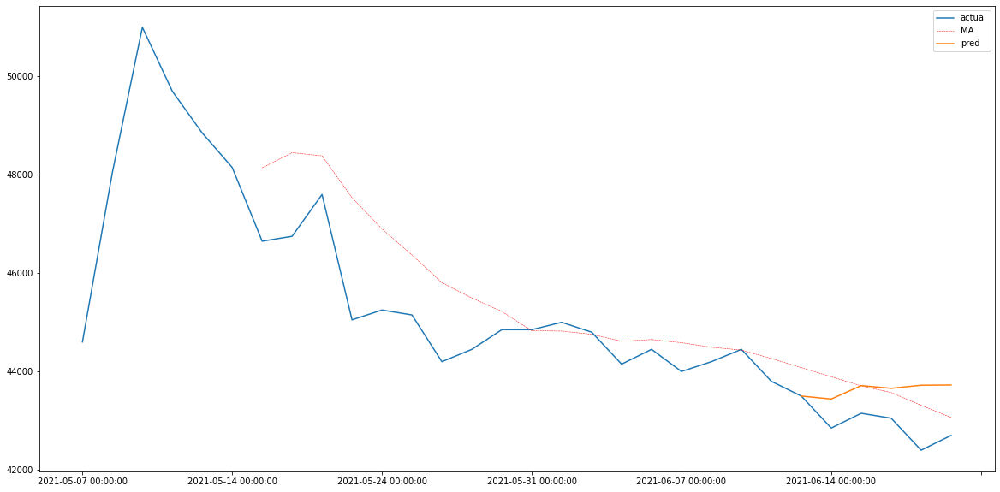

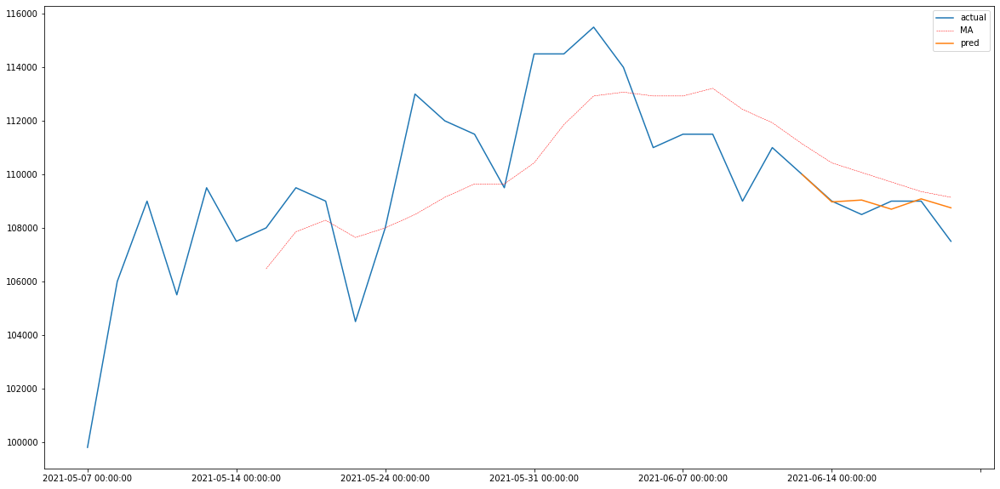

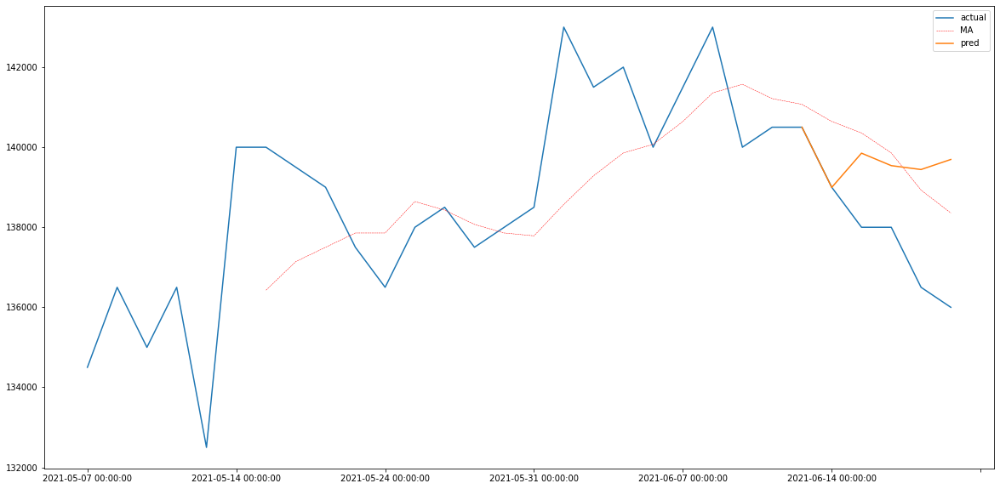

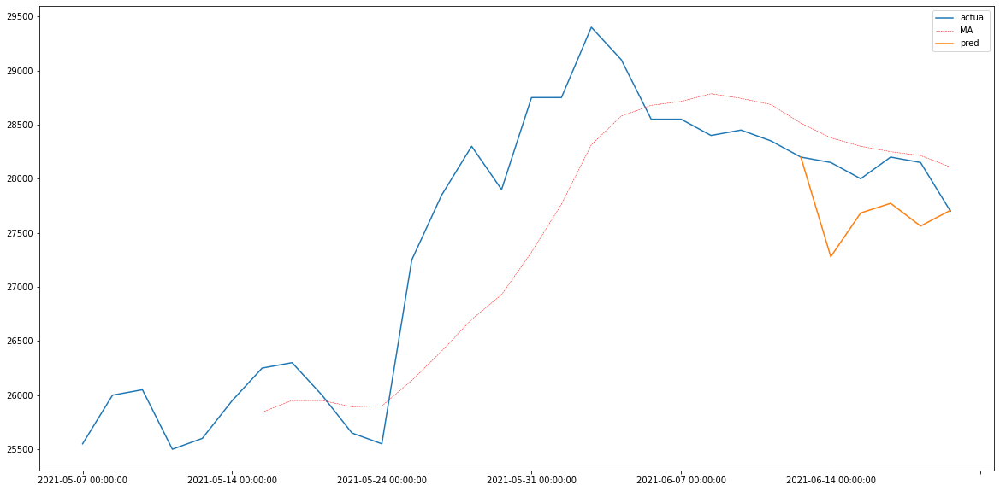

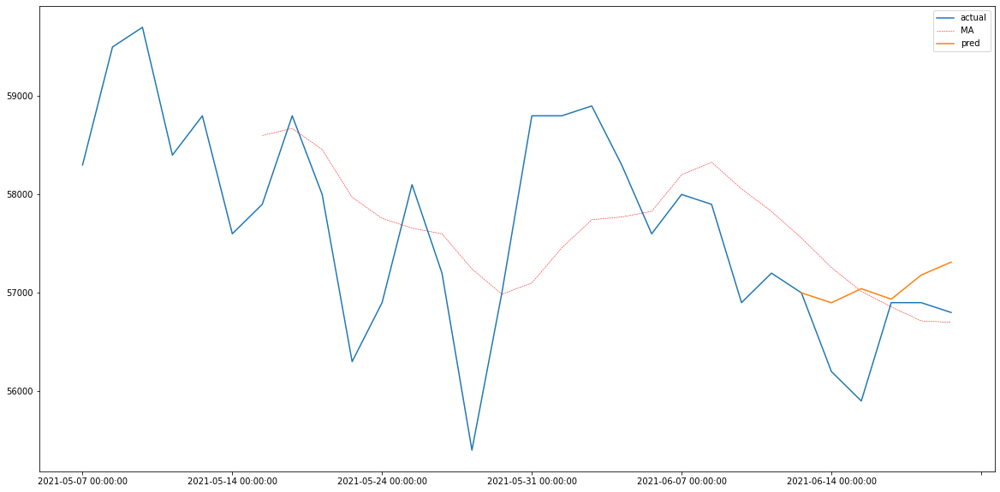

...

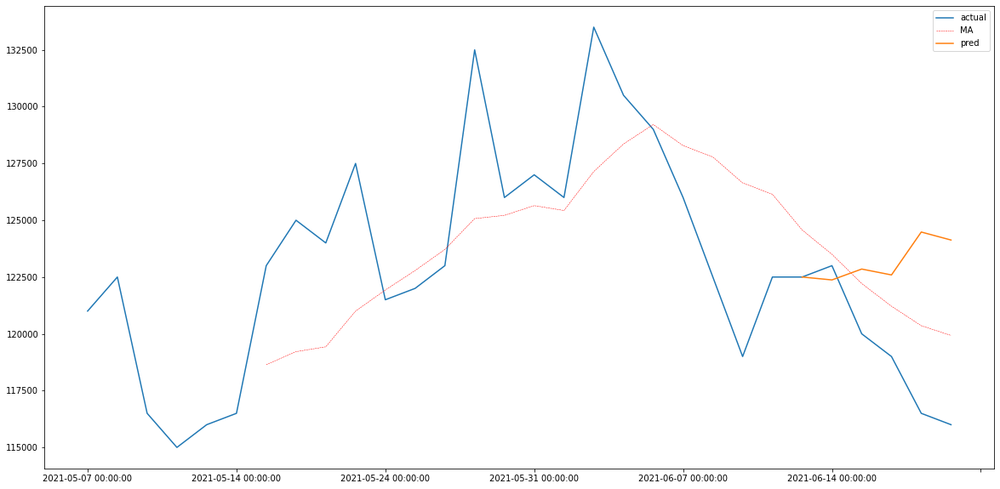

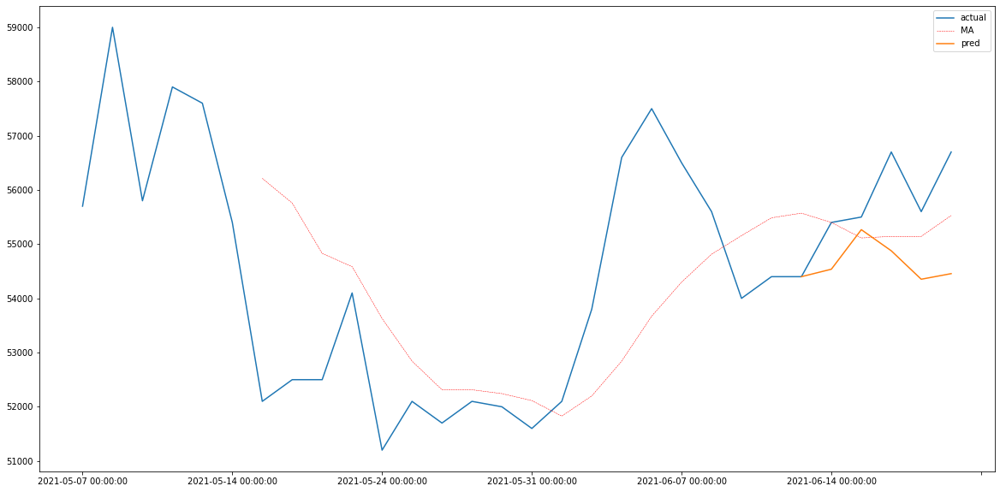

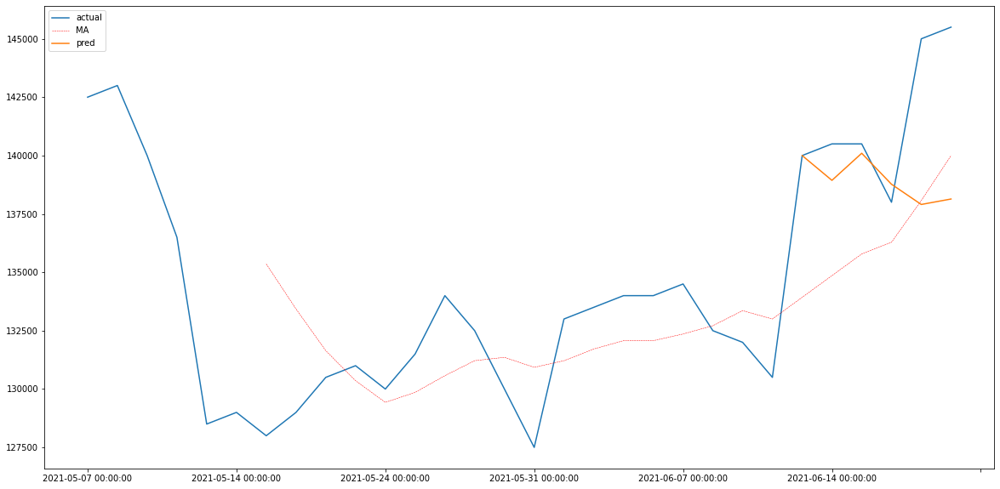

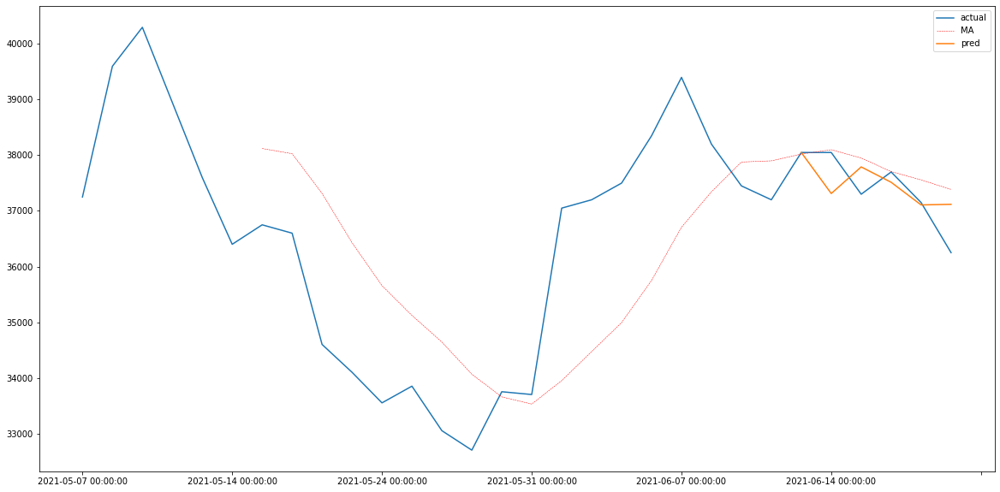

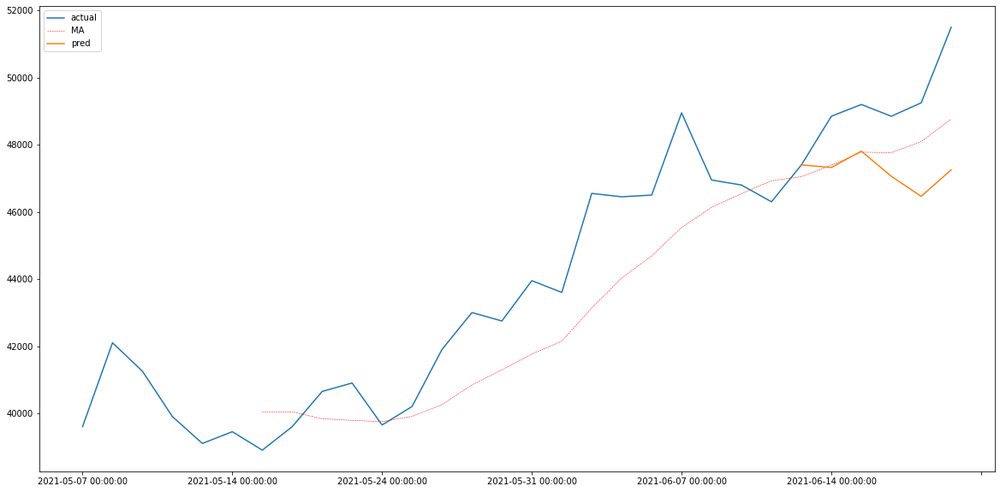

In [ ]:
# 전반적으로 모든 종목에서 scale 정보와 trend를 비교적 잘 잡아냄
for i, row in data_without_holiday['종가'].iterrows():
  fig, ax1 = plt.subplots(figsize=(20,10))
  row.iloc[-30:].plot(ax=ax1)
  row.iloc[-30:].rolling(7).mean().plot(ax=ax1, color='r', linestyle='--', linewidth=0.5)
  plt.plot(range(30-6, 30), np.concatenate([row[-6:-5], pred[pred['name'] == row[0]].iloc[0,1:].values]))
  #plt.title(row[0])
  plt.legend(['actual', 'MA', 'pred'])
  plt.show()

In [ ]:
actual_price = data_without_holiday['종가'][list(pred.columns)]

In [ ]:
resid = pred.iloc[:,1:] - actual_price.iloc[:,1:]

In [ ]:
resid

,2021-06-14 00:00:00,2021-06-15 00:00:00,2021-06-16 00:00:00,2021-06-17 00:00:00,2021-06-18 00:00:00
0,589.980469,562.464844,607.488281,1320.164062,1024.910156
1,-28.906250,541.296875,-301.109375,84.710938,1250.632812
2,-4.562500,1851.421875,1539.875000,2942.593750,3694.109375
3,-870.634766,-316.265625,-427.089844,-586.958984,8.330078
4,698.867188,1142.089844,35.355469,281.003906,512.050781
...,...,...,...,...,...
195,-627.515625,2851.218750,3591.773438,7980.859375,8128.468750
196,-862.203125,-232.691406,-1822.460938,-1247.109375,-2243.898438
197,-1561.906250,-401.546875,771.328125,-7095.046875,-7361.234375
198,-737.261719,490.824219,-185.558594,-42.472656,868.742188


### 정량적 분석
- 모델의 오차에 대해서 [quatile loss](https://arxiv.org/pdf/1711.11053.pdf)를 이용하여  정량적으로 분석을 실시했습니다.
  - 아래와 같이 가정하여 q={0.5,0.1,0.9}의 세가지 오차에 대해 해석했습니다.
    - q=0.9 : 과소 추정에 대해 큰 페널티
    - q=0.1 : 과대 추정에 대해 큰 페널티
    - q=0.5 : MAE

- quatile loss를 이용하여 분석하였을 때, 과소 예측에 의한 오차가 다른 오차들 보다 두드러져 모델이 비교적 소극적인 예측을 한다고 생각이 되었습니다.
  - 이는 과소 예측이 큰 상위 5개 종목, 과대 예측이 큰 상위 5개 종목을 비교하여 그림으로 보았을 때 더욱 두드러졌습니다.
  - 가령 해당 모델을 참고하여 실제 투자를 한다면 위험은 줄겠지만 수익 역시 줄어드는 문제가 있을 것으로 예상이 됩니다.
    - 해당 문제에 대한 해결책으로 수익을 극대화하는 방향의 학습 방법이 도움이 될 수 있을 것 같습니다.
  - 다만 오차가 매우 큰 oulier들을 제외하고 보았을 때에는 세가지 오차가 비슷한 수준을 보였습니다.

- 다소 당연한 이야기일 수는 있으나 주당 가격이 큰 종목들에서 오차 역시 크게 관측 되었습니다.

In [ ]:
# quantile loss
# ref : https://arxiv.org/pdf/1711.11053.pdf
def relu(x):
  new = x.copy()
  new[np.where(new<0)] = 0
  return  new

def quantile_loss(diff, q=0.5):
  ql = (1-q)*relu(diff) + q*relu(-diff)
  losses = ql.mean(0)
  return losses

In [ ]:
mae = np.apply_along_axis(quantile_loss, 1, resid.values, 0.5)
penalty_on_low_esti = np.apply_along_axis(quantile_loss, 1, resid.values, 0.9)
penalty_on_high_esti = np.apply_along_axis(quantile_loss, 1, resid.values, 0.1)

In [ ]:
from scipy.stats import spearmanr
# H0 : ρs = 0, one-sided test
## 귀무가설 기각하여 상관이 있는 것으로 해석
## 상관계수가 0.7980으로 매우 높음
## 따라서 주당 가격이 높을 수록 오차도 높아지는 문제가 있는 것으로 보임
mean_vector = data_without_holiday['종가'].iloc[:, 1:].mean(axis=1)
coef, p = spearmanr(mean_vector, mae)
print(f'coef : {coef}, p_val : {p}')

coef : 0.7980979524488113, p_val : 1.9285316840152352e-45


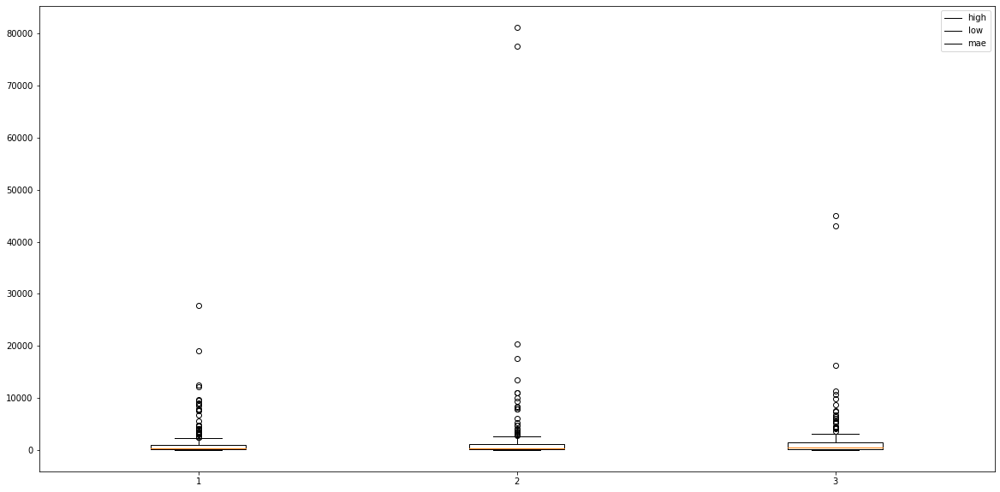

In [ ]:
# boxplot
# 과소 예측에 의한 오차가 다른 오차들보다 두드러지는 것으로 보임
plt.figure(figsize=(20,10))
plt.boxplot([penalty_on_high_esti, penalty_on_low_esti, mae])
plt.legend(['high', 'low', 'mae'])
plt.show()

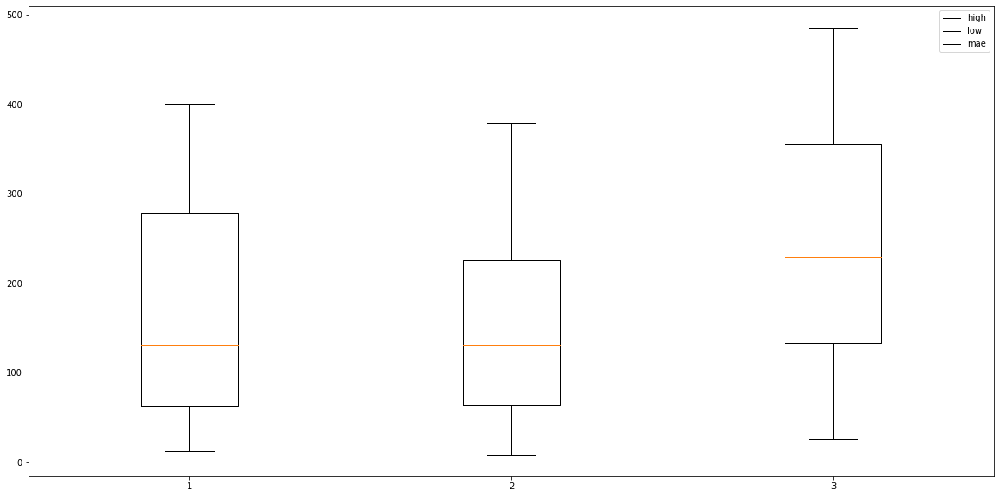

In [ ]:
# boxplot
# 낮은 순으로 100개의 오차들을 봤을 때는 종목별 mae는 200 정도로 보임
plt.figure(figsize=(20,10))
plt.boxplot([sorted(penalty_on_high_esti)[:100], sorted(penalty_on_low_esti)[:100], sorted(mae)[:100]])
plt.legend(['high', 'low', 'mae'])
plt.show()

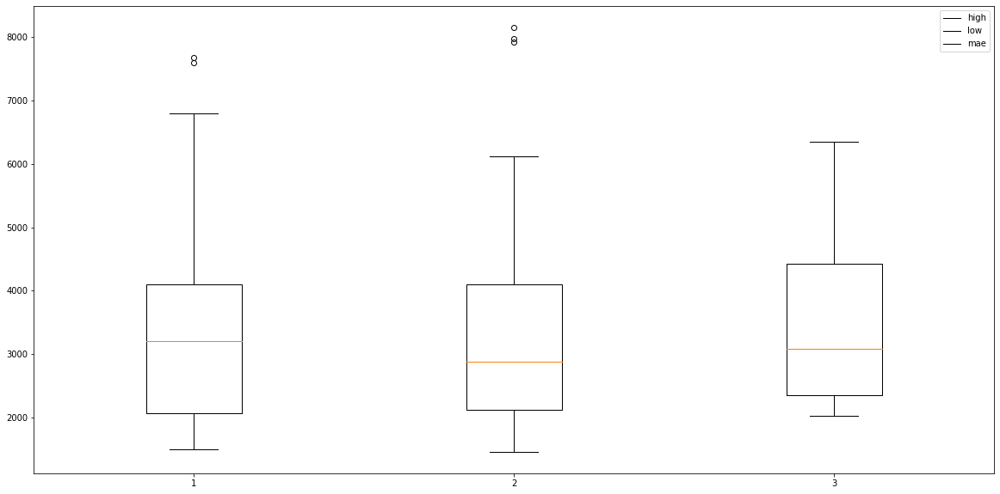

In [ ]:
# boxplot
# 이상치들을 제외하고
# 높은 순으로 30개의 오차들을 봤을 때는 종목별 mae는 3000 정도로 보임
plt.figure(figsize=(20,10))
plt.boxplot([sorted(penalty_on_high_esti)[-40:-10], sorted(penalty_on_low_esti)[-40:-10], sorted(mae)[-40:-10]])
plt.legend(['high', 'low', 'mae'])
plt.show()

태광산업


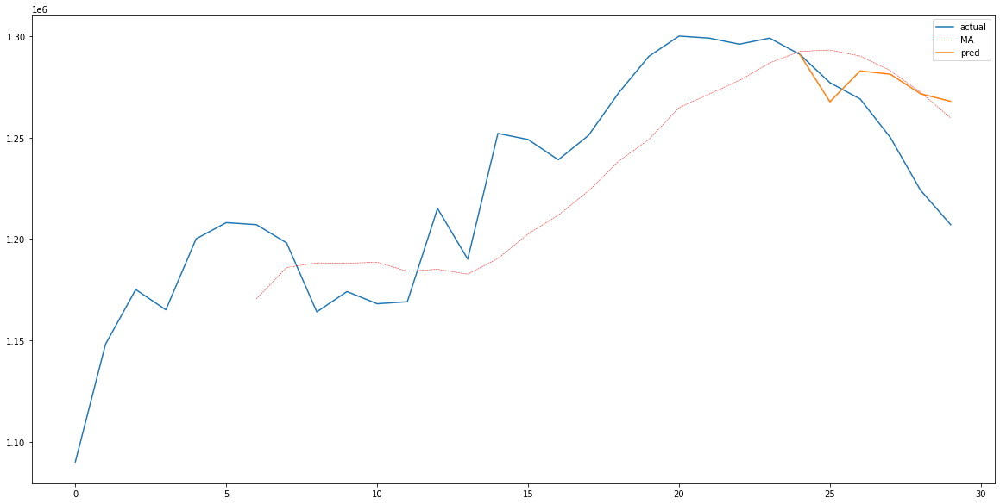

영풍


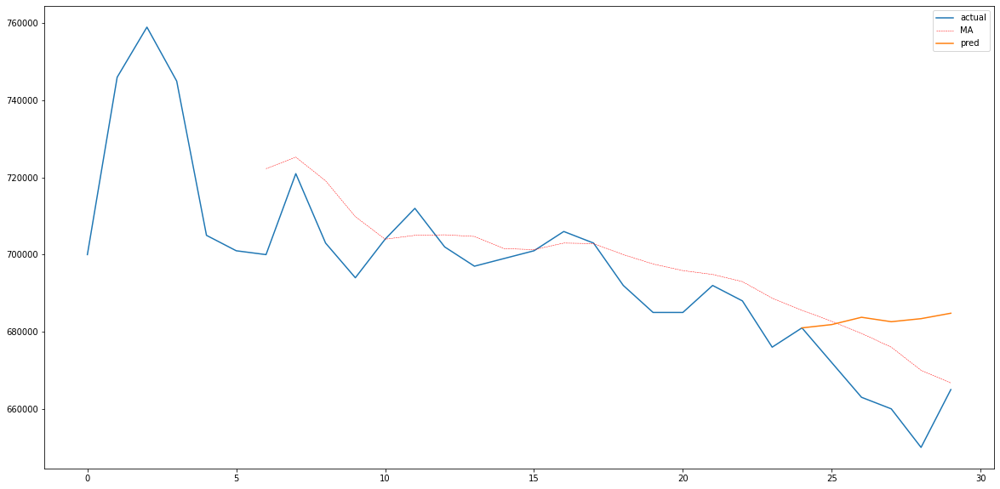

F&F홀딩스


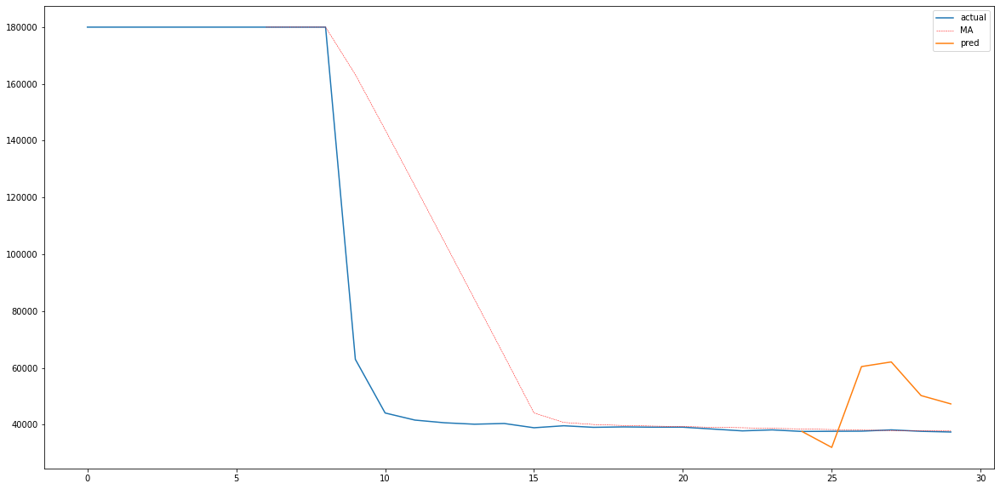

LG화학


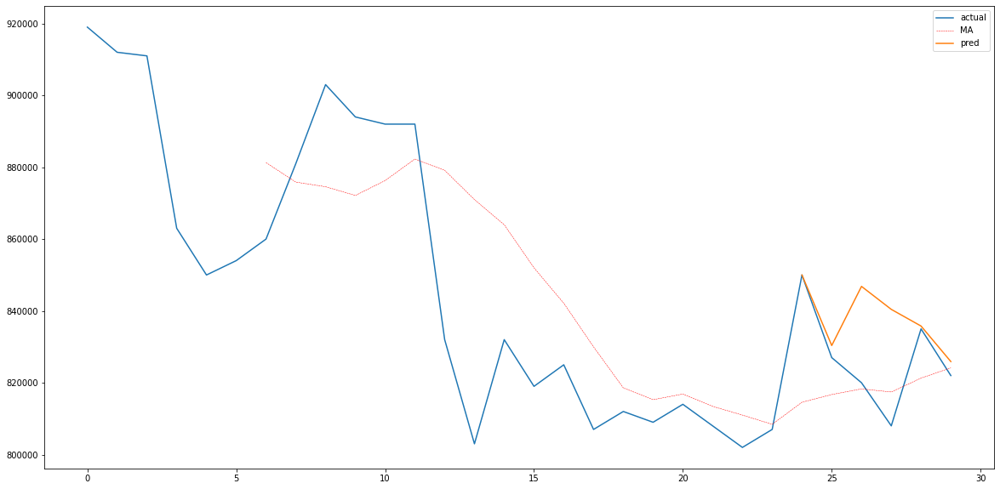

삼성바이오로직스


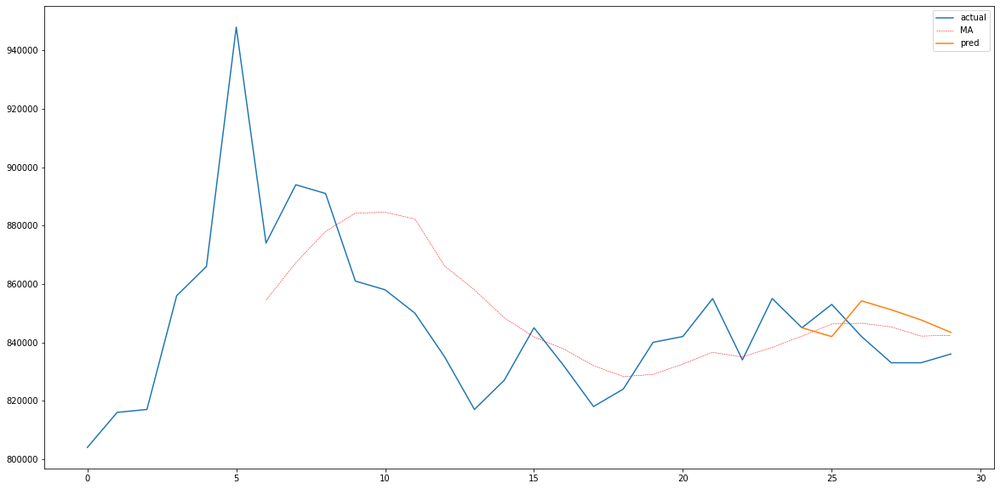

In [ ]:
# 과대 예측에 의한 오차가 큰 5개 종목
## 태광산업, 영풍, F&F홀딩스, LG화학, 삼성바이오로직스
for i in range(1, 6):
  fig, ax1 = plt.subplots(figsize=(20,10))
  idx =np.argsort(penalty_on_high_esti)[-1*i]
  print(data_without_holiday['종가'].name[idx])
  row = data_without_holiday['종가'][data_without_holiday['종가'].index==idx]
  plt.plot(row.iloc[:,-30:].values.flatten())
  plt.plot(row.iloc[:,-30:].rolling(7, axis=1).mean().values.flatten(), color='r', linestyle='--', linewidth=0.5)
  plt.plot(range(30-6, 30), np.concatenate([row.iloc[:,-6:-5].values[0], pred[pred['name'] == row.iloc[0][0]].iloc[0,1:].values]))
  plt.legend(['actual', 'MA', 'pred'])
  plt.show()

LG생활건강


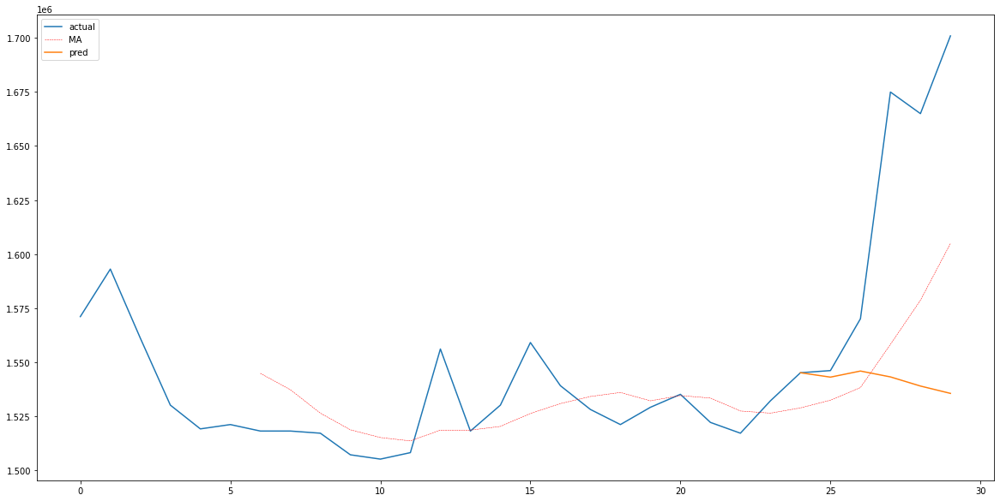

효성티앤씨


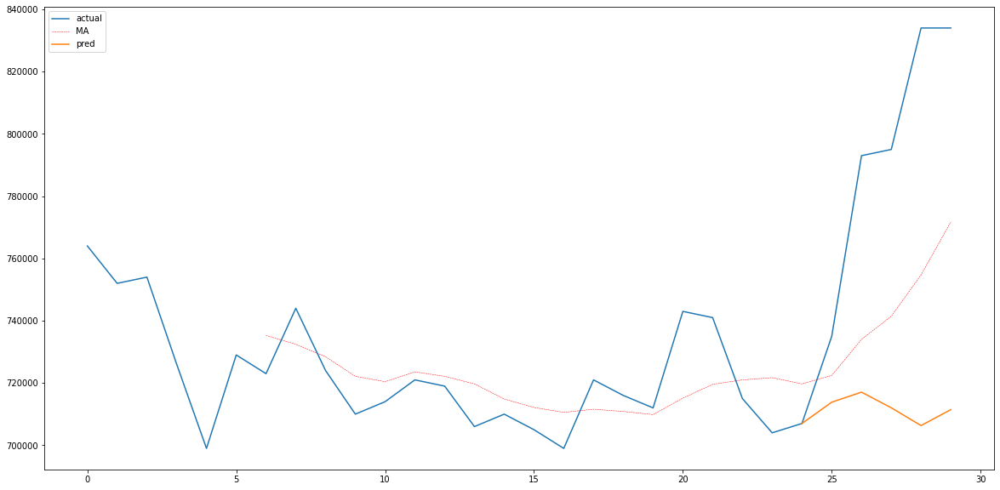

삼성SDI


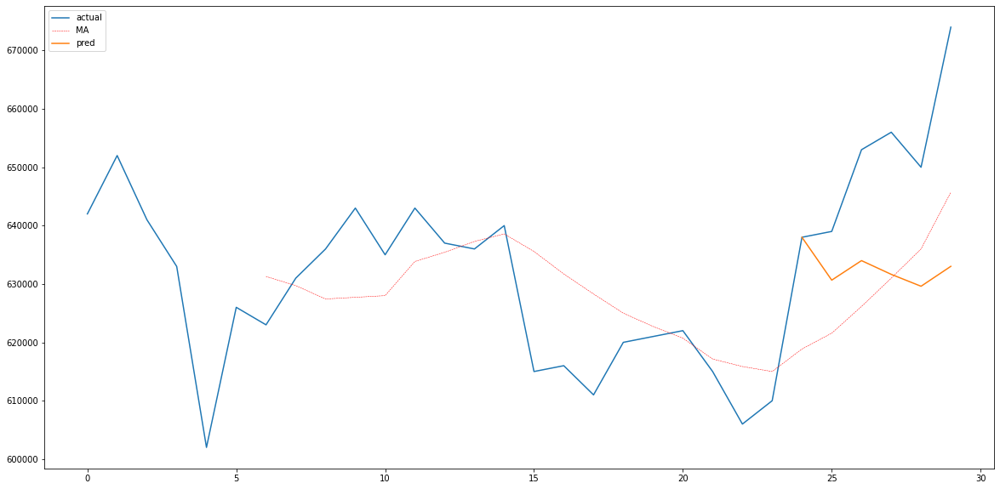

효성첨단소재


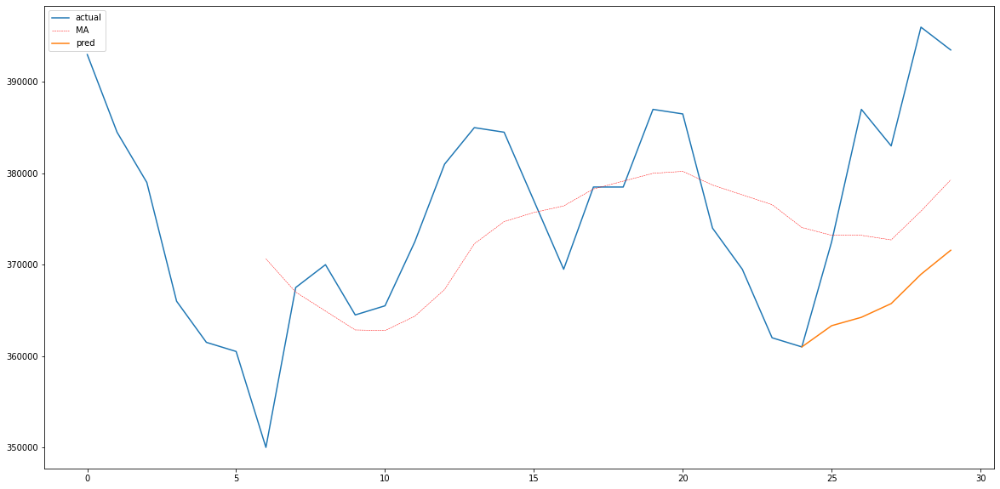

하이브


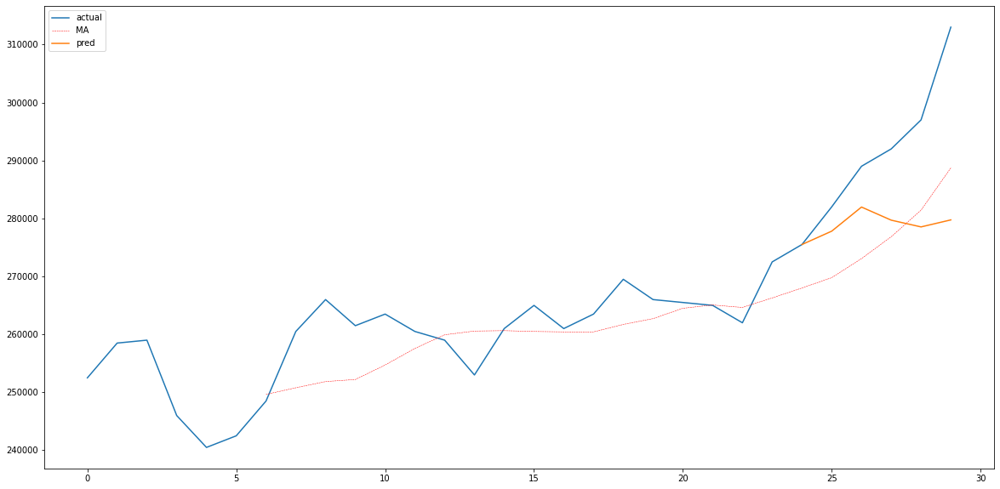

In [ ]:
# 과소 예측에 의한 오차가 큰 5개 종목
## LG생활건강, 효성티앤씨, 삼성SDI, 효성첨단소재, 하이브
for i in range(1, 6):
  fig, ax1 = plt.subplots(figsize=(20,10))
  idx = np.argsort(penalty_on_low_esti)[-1*i]
  print(data_without_holiday['종가'].name[idx])
  row = data_without_holiday['종가'][data_without_holiday['종가'].index==idx]
  plt.plot(row.iloc[:,-30:].values.flatten())
  plt.plot(row.iloc[:,-30:].rolling(7, axis=1).mean().values.flatten(), color='r', linestyle='--', linewidth=0.5)
  plt.plot(range(30-6, 30), np.concatenate([row.iloc[:,-6:-5].values[0], pred[pred['name'] == row.iloc[0][0]].iloc[0,1:].values]))
  plt.legend(['actual', 'MA', 'pred'])
  plt.show()

LG생활건강


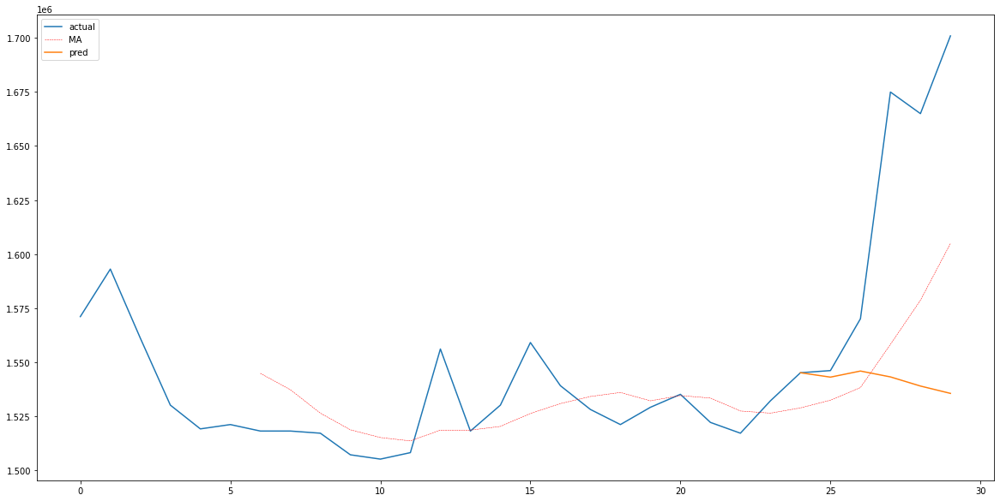

효성티앤씨


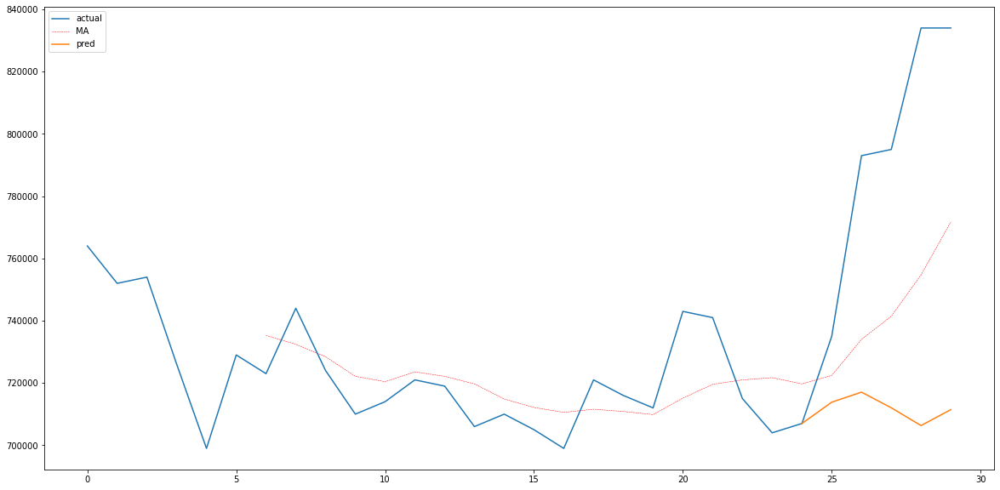

태광산업


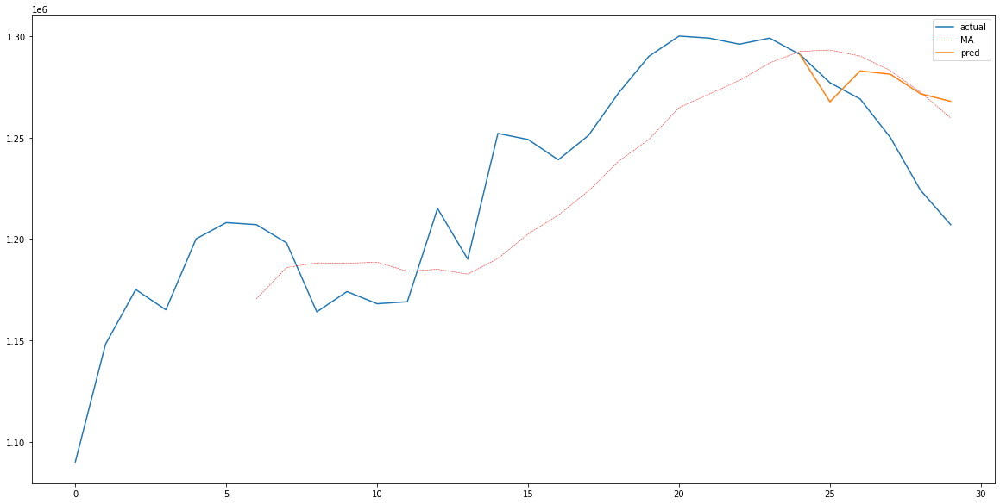

삼성SDI


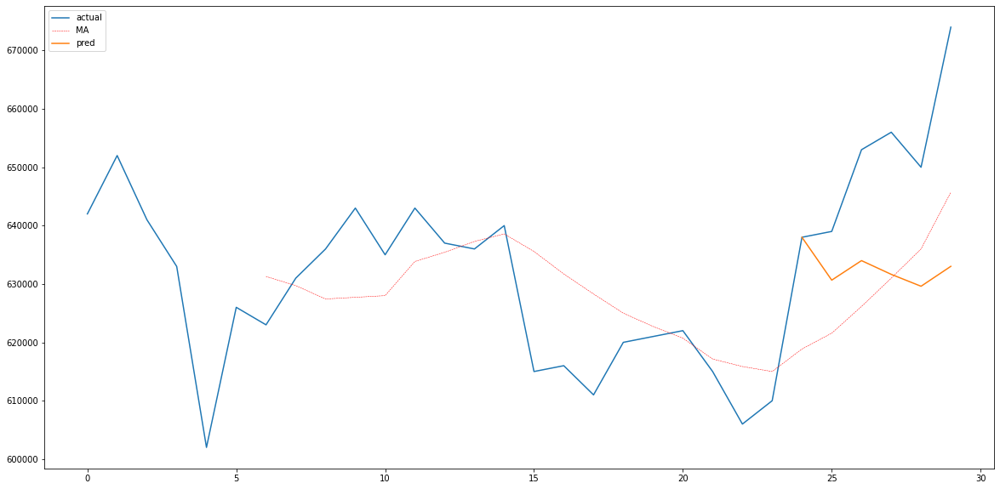

영풍


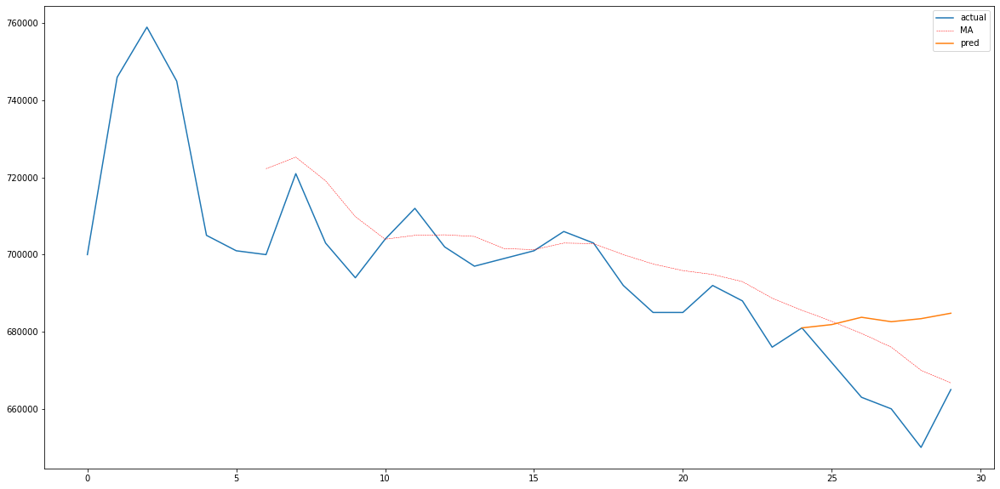

In [ ]:
# MAE 오차가 큰 5개 종목
## LG생활건강, 효성티앤씨, 태광산업, 삼성SDI, 영풍
for i in range(1, 6):
  fig, ax1 = plt.subplots(figsize=(20,10))
  idx= np.argsort(mae)[-1*i]
  print(data_without_holiday['종가'].name[idx])
  row = data_without_holiday['종가'][data_without_holiday['종가'].index==idx]
  plt.plot(row.iloc[:,-30:].values.flatten())
  plt.plot(row.iloc[:,-30:].rolling(7, axis=1).mean().values.flatten(), color='r', linestyle='--', linewidth=0.5)
  plt.plot(range(30-6, 30), np.concatenate([row.iloc[:,-6:-5].values[0], pred[pred['name'] == row.iloc[0][0]].iloc[0,1:].values]))
  plt.legend(['actual', 'MA', 'pred'])
  plt.show()

메리츠증권


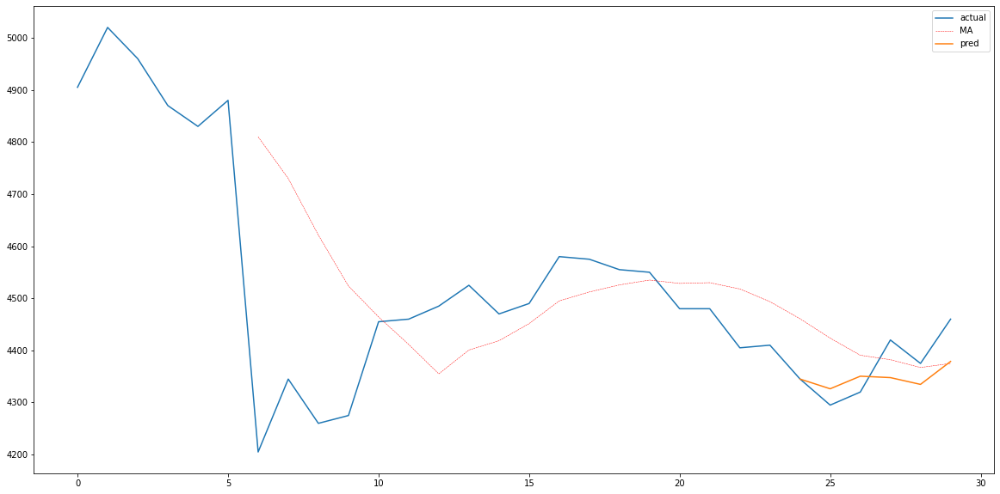

한화생명


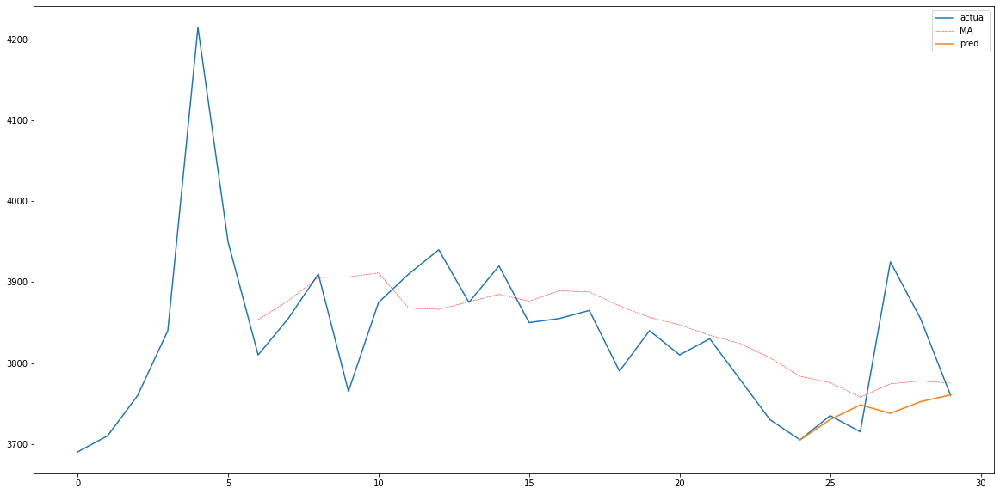

대우건설


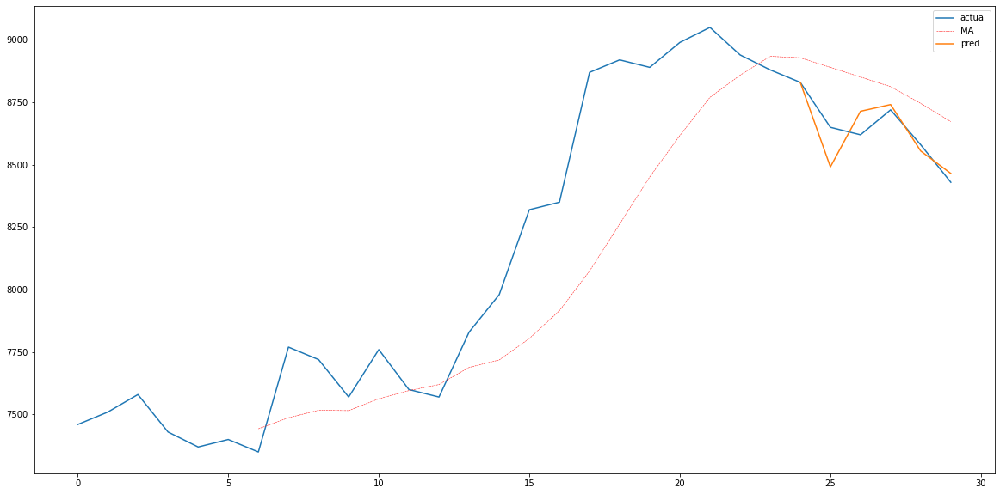

BNK금융지주


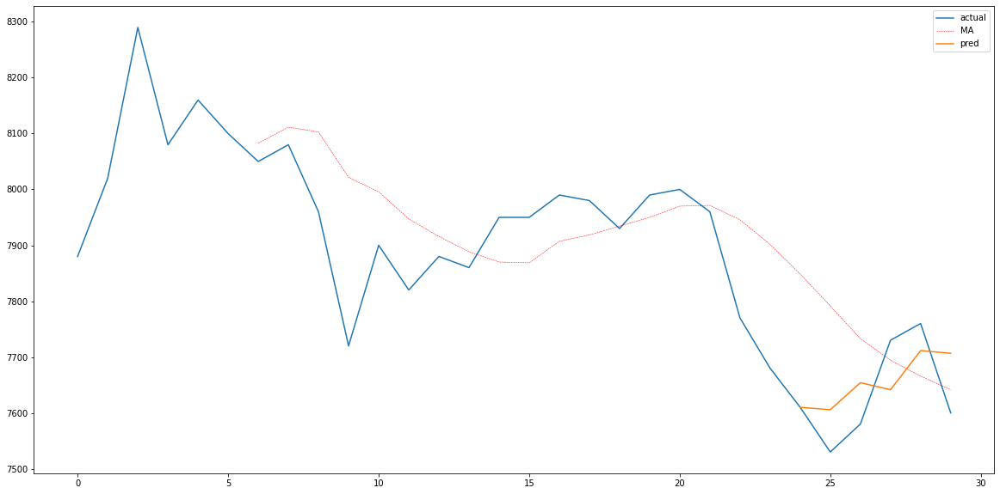

삼성중공업


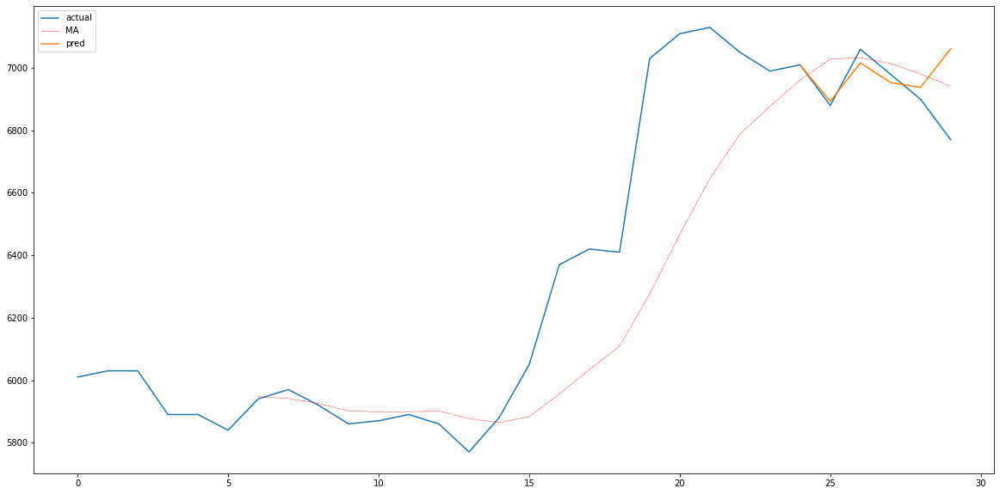

In [ ]:
# 오차가 작은 5개 종목
## 메리츠증권, 한화생명, 대우건설, BNK금융지주, 삼성중공업
## 변화가 적고 주당 가격이 작은 종목들임
for i in range(5):
  fig, ax1 = plt.subplots(figsize=(20,10))
  idx= np.argsort(mae)[i]
  print(data_without_holiday['종가'].name[idx])
  row = data_without_holiday['종가'][data_without_holiday['종가'].index==idx]
  plt.plot(row.iloc[:,-30:].values.flatten())
  plt.plot(row.iloc[:,-30:].rolling(7, axis=1).mean().values.flatten(), color='r', linestyle='--', linewidth=0.5)
  plt.plot(range(30-6, 30), np.concatenate([row.iloc[:,-6:-5].values[0], pred[pred['name'] == row.iloc[0][0]].iloc[0,1:].values]))
  plt.legend(['actual', 'MA', 'pred'])
  plt.show()

### Prophet
- 추가적으로 적용이 쉽고 비교적 많이 쓰이는 [Prophet 모델](https://github.com/facebook/prophet)을 간단히 적합하여 제공해주신 예측치와 비교해보았습니다.
- mae 오차를 기준으로 제공해주신 모델이 간단한 Prophet 모델에 비해 크게 좋은 성능을 보여 간단한 통계 모델과는 큰 성능 차이가 있는 것으로 보였습니다.

In [ ]:
from fbprophet import Prophet

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


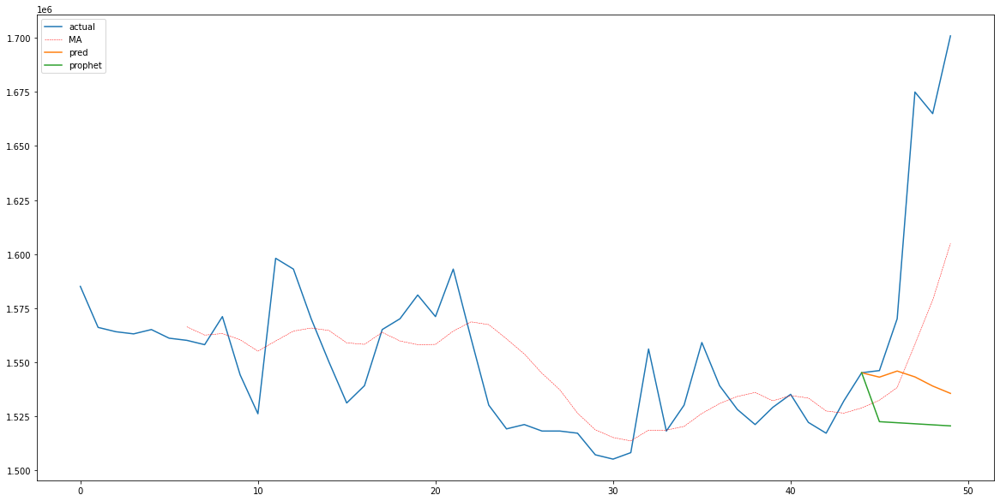

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


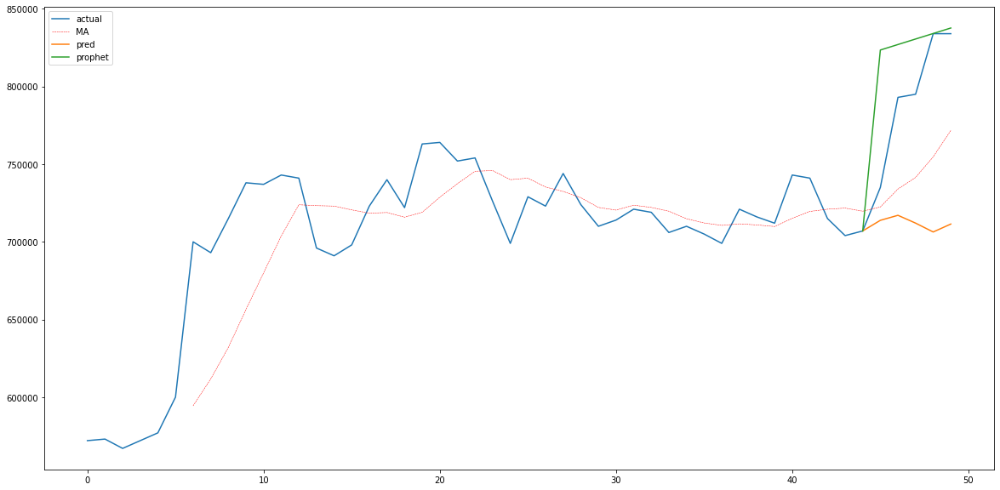

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


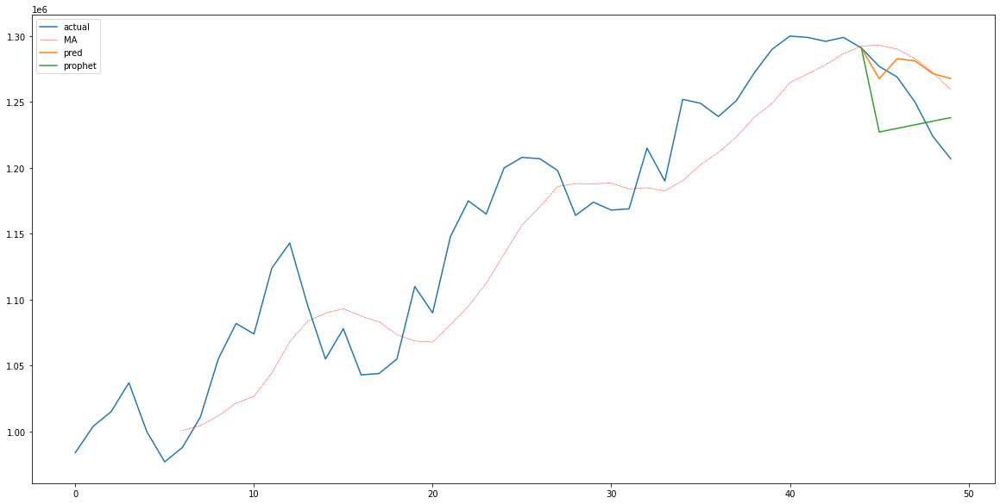

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


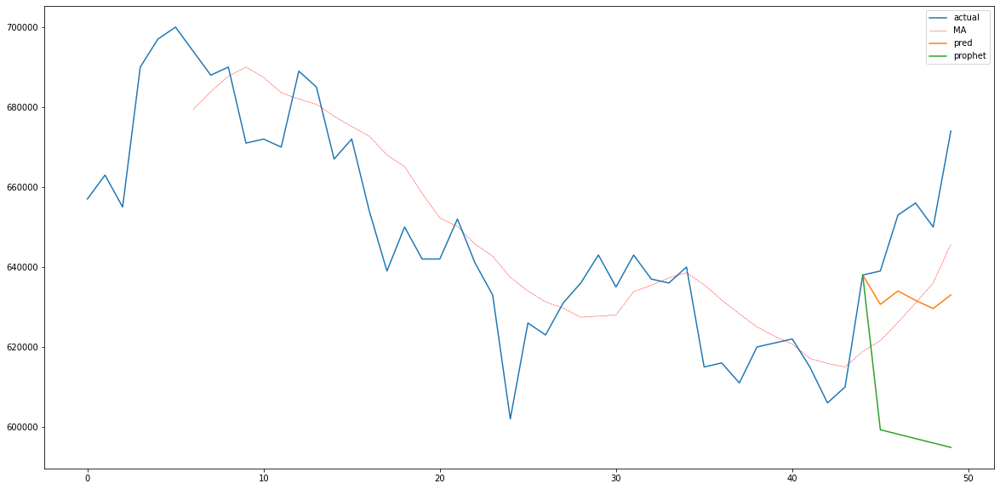

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


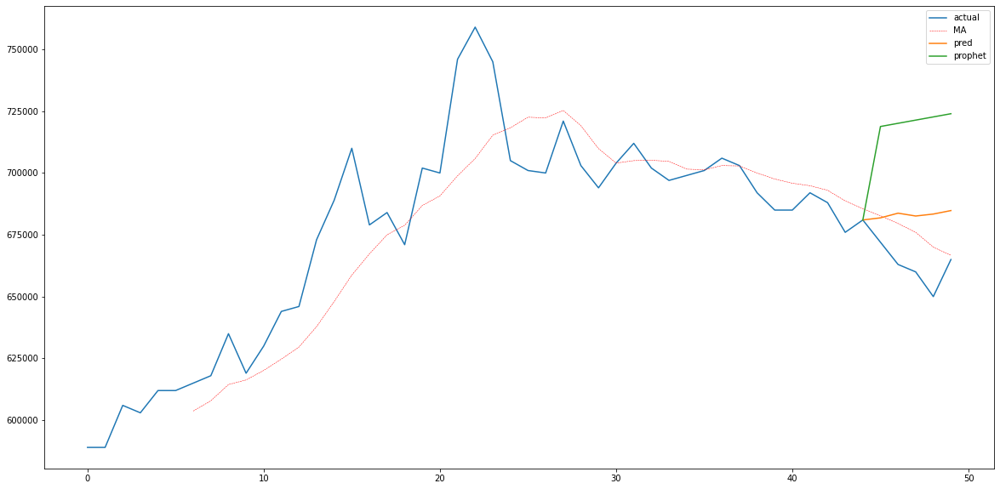

In [ ]:
for i in range(1, 6):
  X = data_without_holiday['종가'][data_without_holiday['종가'].index==np.argsort(mae)[-i]].transpose().reset_index(level=0).iloc[1:490,:]
  X.columns = ['ds', 'y']
  m = Prophet(weekly_seasonality=False, changepoint_prior_scale=1)
  m.fit(X)
  future = m.make_future_dataframe(periods=8)
  forecast = m.predict(future)

  fig, ax1 = plt.subplots(figsize=(20,10))
  row = data_without_holiday['종가'][data_without_holiday['종가'].index==np.argsort(mae)[-i]]
  plt.plot(row.iloc[:,-50:].values.flatten())
  plt.plot(row.iloc[:,-50:].rolling(7, axis=1).mean().values.flatten(), color='r', linestyle='--', linewidth=0.5)
  plt.plot(range(50-6, 50), np.concatenate([row.iloc[:,-6:-5].values[0], pred[pred['name'] == row.iloc[0][0]].iloc[0,1:].values]))
  plt.plot(range(50-6, 50), np.concatenate([row.iloc[:,-6:-5].values[0], forecast['yhat'].iloc[-5:].values]))
  plt.legend(['actual', 'MA', 'pred', 'prophet'])
  plt.show()

In [ ]:
!pip install pandarallel

In [ ]:
from pandarallel import pandarallel
pandarallel.initialize(progress_bar=True)

INFO: Pandarallel will run on 1 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [ ]:
def fit_pred(row):
  X = pd.DataFrame(
      {'ds':row.index,
       'y':row.values }
  )
  X.columns = ['ds', 'y']
  m = Prophet(weekly_seasonality=False, changepoint_prior_scale=1)
  m.fit(X)
  future = m.make_future_dataframe(periods=8)
  forecast = m.predict(future)
  return forecast['yhat'].iloc[-5:].values

In [ ]:
pred_prophet = pred.iloc[:,:]
pred_values = data_without_holiday['종가'].iloc[:,1:].parallel_apply(fit_pred, axis=1)
pred_prophet.iloc[:,1:] = np.concatenate(pred_values.values).reshape(-1,5)

In [ ]:
resid = pred_prophet.iloc[:,1:] - actual_price.iloc[:,1:]
mae_prophet = np.apply_along_axis(quantile_loss, 1, resid.values, 0.5)

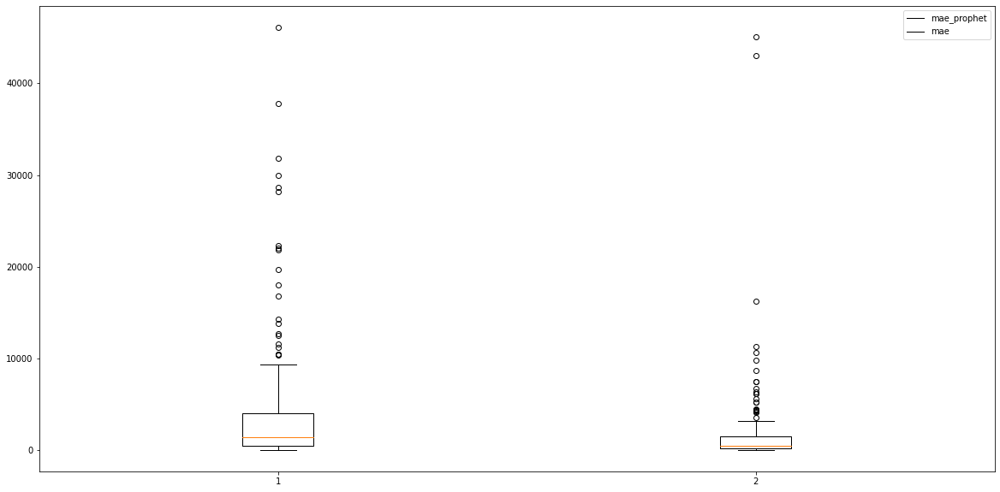

In [ ]:
plt.figure(figsize=(20,10))
plt.boxplot([mae_prophet, mae])
plt.legend(['mae_prophet', 'mae'])
plt.show()

In [ ]:
mae_prophet.mean()

3973.7959870146747

In [ ]:
mae.mean()

1797.9051096191406